In [2]:
import plot
import importlib
import numpy as np
import random
import os
import glob
import h5py
import math
import scipy
import random
import classify
import warnings
import preprocess
import matplotlib
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from os import path
from scipy import stats
from scipy.io import loadmat
from matplotlib import gridspec
from numpy.linalg import norm
from scipy.spatial import distance
from sklearn import decomposition
from matplotlib.colors import LinearSegmentedColormap
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
warnings.filterwarnings('ignore')
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

np.random.seed(42)
random.seed(42)


In [3]:

# reload when updating code
importlib.reload(preprocess)
# mouse and date

mice = ['NN11'] 
dates_per_mouse = {'NN11': ['210626']}

for mouse in mice:
    dates = dates_per_mouse[mouse]  # Get the list of dates for the current mouse
    days = len(dates)  # Correct number of days for this mouse
    
    for day_idx, date in enumerate(dates):
        print(mouse, date)
        
        # Create folders to save files
        paths = preprocess.create_folders(mouse, date)
        print('folders created')
        
        # Import data for mouse and date as dict
        session_data = preprocess.load_data(paths)
        print('data loaded')
        
        # Process and plot behavior
        behavior = preprocess.process_behavior(session_data, paths)
        print('behavior done')
        
        # Save masks so can run in Matlab to process other planes
        # preprocess.cell_masks(paths, 0)
        print('masks saved')
        
        # Grab activity
        deconvolved = preprocess.process_activity(paths, 'spks', 3, 0)
        print('activity processed')
        
        # Normalize activity
        norm_deconvolved = preprocess.normalize_deconvolved(deconvolved, behavior, paths, 0)
        print('activity normalized')
        
        # Gaussian filter activity
        norm_moving_deconvolved_filtered = preprocess.difference_gaussian_filter(norm_deconvolved, 4, behavior, paths, 0)
        print('activity filtered')
        
        # Make trial-averaged traces and baseline subtract
        mean_cs_1_responses_df = preprocess.normalized_trial_averaged(norm_deconvolved, behavior, 'cs_1')
        mean_cs_2_responses_df = preprocess.normalized_trial_averaged(norm_deconvolved, behavior, 'cs_2')
        print('traces done')
        
        # Get significant cells
        [cs_1_poscells, cs_1_negcells] = preprocess.sig_test(norm_deconvolved, behavior, 'cs_1')
        [cs_2_poscells, cs_2_negcells] = preprocess.sig_test(norm_deconvolved, behavior, 'cs_2')
        [both_poscells, both_sigcells] = preprocess.combine_sig(cs_1_poscells, cs_1_negcells, cs_2_poscells, cs_2_negcells)
        print('sig cells done')
        
        # Get index of top cell differences
        idx = preprocess.get_index(behavior, mean_cs_1_responses_df, mean_cs_2_responses_df, cs_1_poscells, cs_2_poscells, both_poscells, both_sigcells, paths, 1)
        print('idx done')
        
        # Get prior for synchronous cue activity
        prior = classify.prior(norm_moving_deconvolved_filtered, idx['cs_1'], idx['cs_2'], behavior, [])
        print('prior done')
        
        # Logistic regression
        y_pred_log = classify.log_regression(behavior, norm_deconvolved, norm_moving_deconvolved_filtered, both_poscells, prior)
        print('logistic regression done')
        
        # Process classified output
        y_pred = classify.process_classified(y_pred_log, prior, paths, 1)
        print('classified done')
    


NN11 210626
folders created
data loaded
behavior done
masks saved
activity processed
activity normalized
activity filtered
traces done
sig cells done
idx done
prior done
logistic regression done
classified done


In [4]:
behavior.keys()

dict_keys(['onsets', 'offsets', 'cue_codes', 'cs_1_code', 'cs_2_code', 'licking', 'running', 'pupil', 'cs_1_trials', 'cs_2_trials', 'frames_before', 'frames_after', 'framerate', 'frames_per_run', 'task_runs', 'iti', 'dark_runs', 'brain_motion', 'pupil_max', 'pupil_min', 'task_times', 'relevant_times', 'cue_offset', 'pupil_movement', 'pupil_movement_max', 'end_trials', 'start_trials', 'phase_correlation'])

In [5]:
#print("onsets", behavior['onsets'])
#print("offsets", behavior['offsets'])
#print("cue_codes", behavior['cue_codes'])
print("cs_1_code", behavior['cs_1_code'])
print("cs_2_code", behavior['cs_2_code'])
print("cs_1_trials", behavior['cs_1_trials'])
print("cs_2_trials", behavior['cs_2_trials'])
print("frames_before", behavior['frames_before'])
print("frames_after", behavior['frames_after'])
print("framerate", behavior['framerate'])
print("frames_per_run", behavior['frames_per_run'])
print("task_runs", behavior['task_runs'])
print("iti", behavior['iti'])
print("task_times", behavior['task_times'])
print("relevant_times", behavior['relevant_times'])
print("cue_offset", behavior['cue_offset'])
print("start_trials", behavior['start_trials'])


cs_1_code 3
cs_2_code 8
cs_1_trials 68
cs_2_trials 60
frames_before 20
frames_after 84
framerate [[10.41666667]]
frames_per_run 21333
task_runs 4
iti 55
task_times [0. 0. 0. ... 0. 0. 0.]
relevant_times [1. 1. 1. ... 0. 0. 0.]
cue_offset 6
start_trials [0, 32, 64, 96]


In [6]:
df = pd.DataFrame(deconvolved)
df.head()
print(df.shape)

(6779, 106665)


In [7]:
df1 = pd.DataFrame(norm_deconvolved)
print(df.shape)

min_per_row = df1.min(axis=1)  
max_per_row = df1.max(axis=1)  

# Combine and display results
result = pd.DataFrame({'Min': min_per_row, 'Max': max_per_row})
print(result)

(6779, 106665)


      Min       Max
0     0.0  2.009800
1     0.0  6.461610
2     0.0  2.778060
3     0.0  3.401244
4     0.0  2.124967
...   ...       ...
6774  0.0  1.806186
6775  0.0  2.027957
6776  0.0  2.026821
6777  0.0  1.632415
6778  0.0  1.874375

[6779 rows x 2 columns]


In [8]:
df2 = pd.DataFrame(norm_moving_deconvolved_filtered)
print(df2.shape)

(6779, 106665)


In [9]:
df3 = pd.DataFrame(mean_cs_1_responses_df)
df4 = pd.DataFrame(mean_cs_2_responses_df)

print(df3.shape)
print(df4.shape)

#these are trial-averaged responses for all cells ocer time for the specific trial type

(6779, 104)
(6779, 104)


Spearman Correlation between RDMs: 0.577 (p=0.000)
Pearson Correlation between RDMs: 0.599 (p=0.000)
Mean Diagonal (cs1): 0.000
Std Dev Diagonal (cs1): 0.000
Mean Diagonal (cs2): 0.000
Std Dev Diagonal (cs2): 0.000


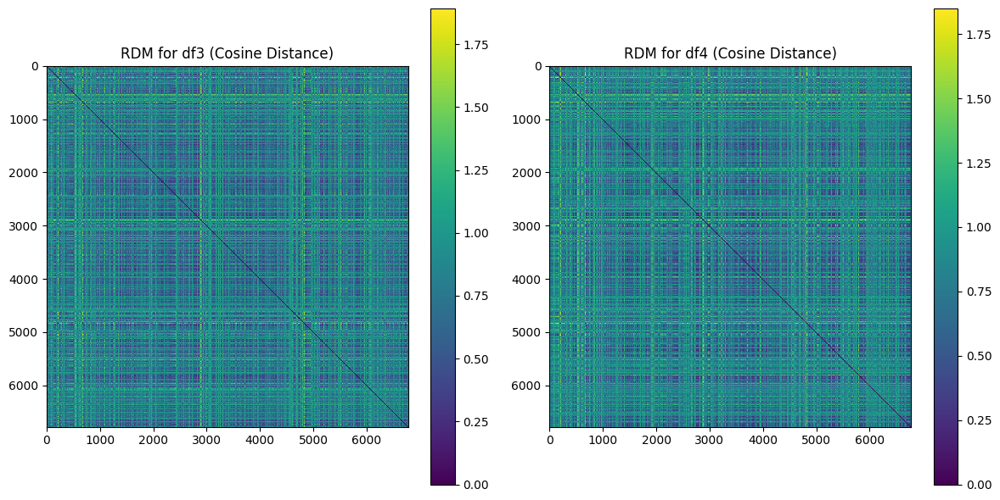

In [10]:
from scipy.spatial.distance import pdist, squareform
from scipy.stats import spearmanr, pearsonr

# Function to compute RDM with cosine distance
#RDM per stimulus, trial-averaged
def compute_rdm_cosine(df):
    distance_matrix = pdist(df.values, metric='cosine')
    rdm = squareform(distance_matrix)
    return rdm

# Compute RDMs
rdm3 = compute_rdm_cosine(df3)
rdm4 = compute_rdm_cosine(df4)

# Flatten RDMs and compare
rdm3_flat = rdm3[np.triu_indices(rdm3.shape[0], k=1)]
rdm4_flat = rdm4[np.triu_indices(rdm4.shape[0], k=1)]

# Correlations
similarity_spearman, p_value_spearman = spearmanr(rdm3_flat, rdm4_flat)
similarity_pearson, p_value_pearson = pearsonr(rdm3_flat, rdm4_flat)

print(f"Spearman Correlation between RDMs: {similarity_spearman:.3f} (p={p_value_spearman:.3f})")
print(f"Pearson Correlation between RDMs: {similarity_pearson:.3f} (p={p_value_pearson:.3f})")

cross_rdm_diagonal_subset1, cross_rdm_diagonal_subset2 = np.diag(rdm3), np.diag(rdm4)
mean_diagonal_subset1, mean_diagonal_subset2 = np.mean(cross_rdm_diagonal_subset1), np.mean(cross_rdm_diagonal_subset2)
std_diagonal_subset1, std_diagonal_subset2, = np.std(cross_rdm_diagonal_subset1), np.std(cross_rdm_diagonal_subset2)

print(f"Mean Diagonal (cs1): {mean_diagonal_subset1:.3f}")
print(f"Std Dev Diagonal (cs1): {std_diagonal_subset1:.3f}")

print(f"Mean Diagonal (cs2): {mean_diagonal_subset2:.3f}")
print(f"Std Dev Diagonal (cs2): {std_diagonal_subset2:.3f}")

# Visualize RDMs
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("RDM for df3 (Cosine Distance)")
plt.imshow(rdm3, cmap='viridis', interpolation='none')
plt.colorbar()

plt.subplot(1, 2, 2)
plt.title("RDM for df4 (Cosine Distance)")
plt.imshow(rdm4, cmap='viridis', interpolation='none')
plt.colorbar()

plt.tight_layout()
plt.show()


Mean Diagonal: 0.631
Std Dev Diagonal: 0.276


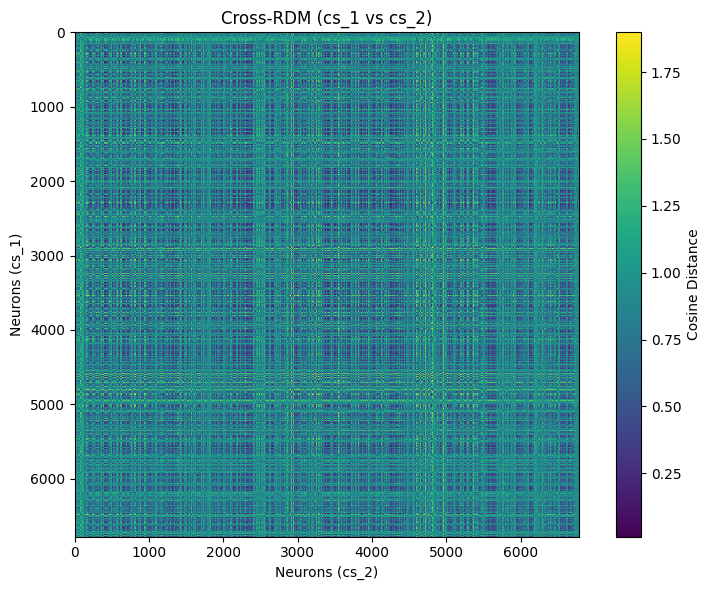

In [11]:
#across stimuli, trial-averaged
from scipy.spatial.distance import cdist

# Compute cross-RDM (cosine distance between neurons in cs_1 and cs_2)
cross_rdm = cdist(df3.values, df4.values, metric='cosine')

cross_rdm_diagonal_subset = np.diag(cross_rdm)
mean_diagonal_subset = np.mean(cross_rdm_diagonal_subset)
std_diagonal_subset = np.std(cross_rdm_diagonal_subset)

print(f"Mean Diagonal: {mean_diagonal_subset:.3f}")
print(f"Std Dev Diagonal: {std_diagonal_subset:.3f}")

# Visualize the cross-RDM
plt.figure(figsize=(8, 6))
plt.title("Cross-RDM (cs_1 vs cs_2)")
plt.imshow(cross_rdm, cmap='viridis', interpolation='none')
plt.colorbar(label='Cosine Distance')
plt.xlabel("Neurons (cs_2)")
plt.ylabel("Neurons (cs_1)")
plt.tight_layout()
plt.show()


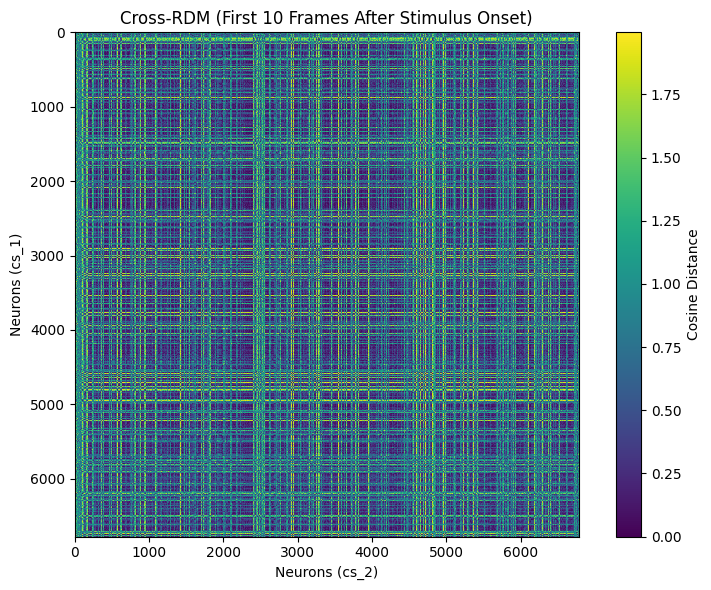

Mean Diagonal (First 10 Frames): 0.494
Std Dev Diagonal (First 10 Frames): 0.390


In [12]:
start_frame = behavior['frames_before']
end_frame = behavior['frames_before'] + 10

# Subset data for the desired range
subset_df3 = df3.iloc[:, start_frame:end_frame]
subset_df4 = df4.iloc[:, start_frame:end_frame]

# Compute the cross-RDM (cosine distance) for the subset
cross_rdm_subset = cdist(subset_df3.values, subset_df4.values, metric='cosine')

# Visualize the subset-based cross-RDM
plt.figure(figsize=(8, 6))
plt.title("Cross-RDM (First 10 Frames After Stimulus Onset)")
plt.imshow(cross_rdm_subset, cmap='viridis', interpolation='none')
plt.colorbar(label='Cosine Distance')
plt.xlabel("Neurons (cs_2)")
plt.ylabel("Neurons (cs_1)")
plt.tight_layout()
plt.show()

# Analyze diagonal values for the subset
cross_rdm_diagonal_subset = np.diag(cross_rdm_subset)
mean_diagonal_subset = np.mean(cross_rdm_diagonal_subset)
std_diagonal_subset = np.std(cross_rdm_diagonal_subset)

print(f"Mean Diagonal (First 10 Frames): {mean_diagonal_subset:.3f}")
print(f"Std Dev Diagonal (First 10 Frames): {std_diagonal_subset:.3f}")


In [13]:
#get top 10% responsive for cs1 in first 10 frames

# Subset the first 10 frames for cs_1 and cs_2
cs_1_first_10 = df3.iloc[:, start_frame:end_frame]
cs_2_first_10 = df4.iloc[:, start_frame:end_frame]

# Compute the mean activity for each neuron
cs_1_mean_responses = cs_1_first_10.mean(axis=1)
cs_2_mean_responses = cs_2_first_10.mean(axis=1)

# Step 2: Get the top 10% most responsive neurons
top_10_percent_count = int(np.ceil(len(cs_1_mean_responses) * 0.10))  # Calculate 10% of neurons

# Get the indices of the top 10% neurons for cs_1 and cs_2
top_10_percent_cs_1 = cs_1_mean_responses.nlargest(top_10_percent_count).index
top_10_percent_cs_2 = cs_2_mean_responses.nlargest(top_10_percent_count).index

# Extract the IDs or indices of these neurons
top_10_percent_cs_1_neurons = df3.index[top_10_percent_cs_1]
top_10_percent_cs_2_neurons = df4.index[top_10_percent_cs_2]

# Step 3: Print the top responsive neurons
print("Top 10% Responsive Neurons for cs_1:")
print(top_10_percent_cs_1_neurons)

print("\nTop 10% Responsive Neurons for cs_2:")
print(top_10_percent_cs_2_neurons)

Top 10% Responsive Neurons for cs_1:
Index([2886, 2966,  152, 4687, 3005,  147, 2991,  203, 3006,  580,
       ...
       3618, 2435, 6308, 5739, 2796, 5245, 1289, 5710, 6179, 2215],
      dtype='int64', length=678)

Top 10% Responsive Neurons for cs_2:
Index([  59, 2889,  112, 3124, 4720,  331,  271, 5046, 3010, 2984,
       ...
       2480, 4777, 1815, 2118, 6476, 3782, 6412,  645, 1829,  411],
      dtype='int64', length=678)


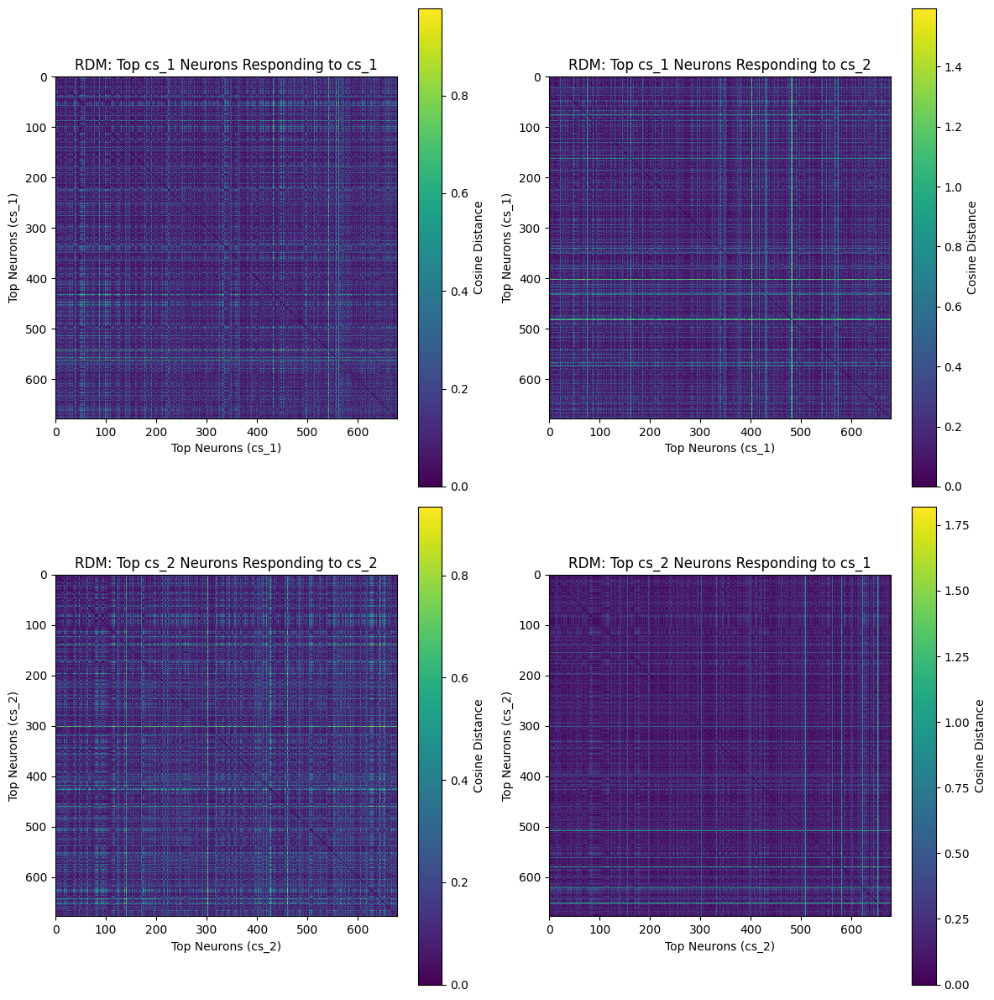

In [14]:
# Step 1: Extract responses for all 4 groups
# Top cs_1 neurons responding to cs_1 and cs_2
top_cs_1_neurons_responses_to_cs_1 = cs_1_first_10.loc[top_10_percent_cs_1_neurons]
top_cs_1_neurons_responses_to_cs_2 = cs_2_first_10.loc[top_10_percent_cs_1_neurons]

# Top cs_2 neurons responding to cs_2 and cs_1
top_cs_2_neurons_responses_to_cs_2 = cs_2_first_10.loc[top_10_percent_cs_2_neurons]
top_cs_2_neurons_responses_to_cs_1 = cs_1_first_10.loc[top_10_percent_cs_2_neurons]

# Step 2: Compute RDMs
rdm_top_cs_1_neurons_cs_1 = squareform(pdist(top_cs_1_neurons_responses_to_cs_1.values, metric='cosine'))
rdm_top_cs_1_neurons_cs_2 = squareform(pdist(top_cs_1_neurons_responses_to_cs_2.values, metric='cosine'))
rdm_top_cs_2_neurons_cs_2 = squareform(pdist(top_cs_2_neurons_responses_to_cs_2.values, metric='cosine'))
rdm_top_cs_2_neurons_cs_1 = squareform(pdist(top_cs_2_neurons_responses_to_cs_1.values, metric='cosine'))

# Step 3: Visualize the RDMs in a 2x2 grid
plt.figure(figsize=(12, 12))

# Top cs_1 neurons responding to cs_1
plt.subplot(2, 2, 1)
plt.title("RDM: Top cs_1 Neurons Responding to cs_1")
plt.imshow(rdm_top_cs_1_neurons_cs_1, cmap='viridis', interpolation='none')
plt.colorbar(label="Cosine Distance")
plt.xlabel("Top Neurons (cs_1)")
plt.ylabel("Top Neurons (cs_1)")

# Top cs_1 neurons responding to cs_2
plt.subplot(2, 2, 2)
plt.title("RDM: Top cs_1 Neurons Responding to cs_2")
plt.imshow(rdm_top_cs_1_neurons_cs_2, cmap='viridis', interpolation='none')
plt.colorbar(label="Cosine Distance")
plt.xlabel("Top Neurons (cs_1)")
plt.ylabel("Top Neurons (cs_1)")

# Top cs_2 neurons responding to cs_2
plt.subplot(2, 2, 3)
plt.title("RDM: Top cs_2 Neurons Responding to cs_2")
plt.imshow(rdm_top_cs_2_neurons_cs_2, cmap='viridis', interpolation='none')
plt.colorbar(label="Cosine Distance")
plt.xlabel("Top Neurons (cs_2)")
plt.ylabel("Top Neurons (cs_2)")

# Top cs_2 neurons responding to cs_1
plt.subplot(2, 2, 4)
plt.title("RDM: Top cs_2 Neurons Responding to cs_1")
plt.imshow(rdm_top_cs_2_neurons_cs_1, cmap='viridis', interpolation='none')
plt.colorbar(label="Cosine Distance")
plt.xlabel("Top Neurons (cs_2)")
plt.ylabel("Top Neurons (cs_2)")

plt.tight_layout()
plt.show()



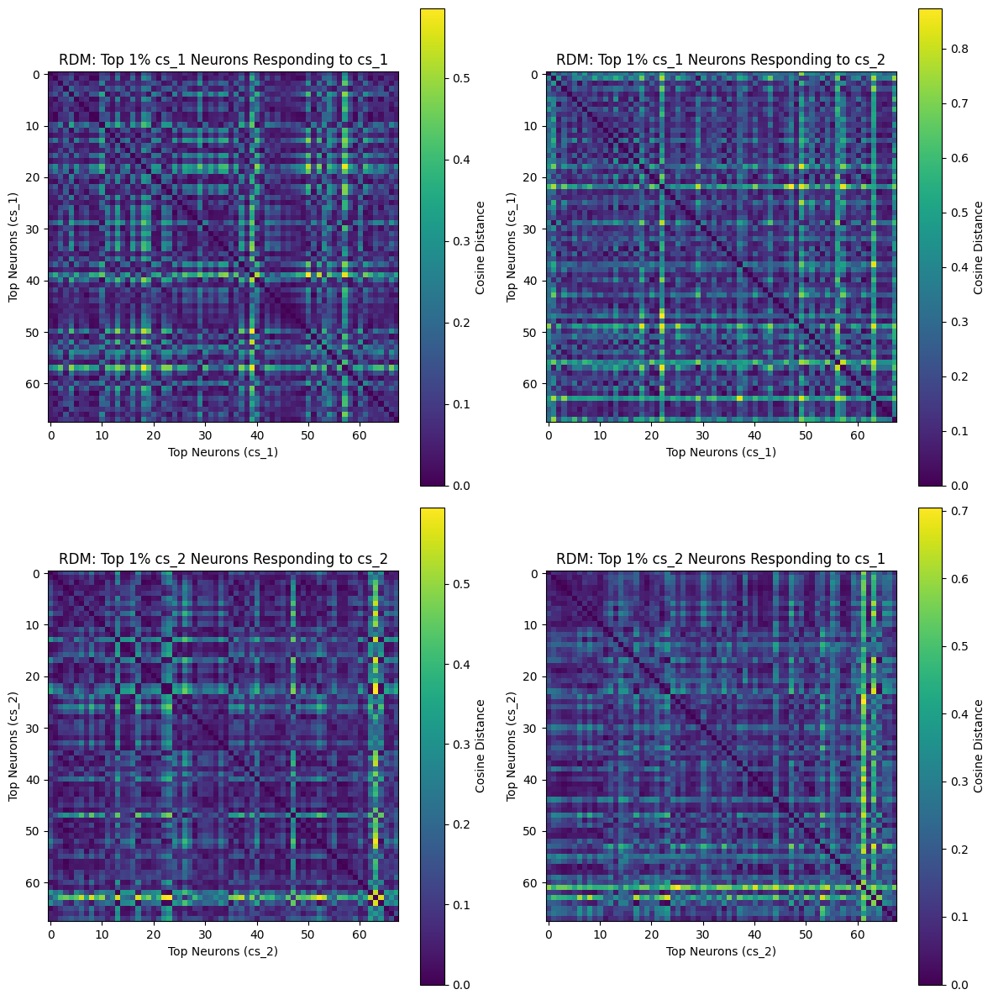

In [15]:
# Step 1: Get the top 1% most responsive neurons
top_1_percent_count = int(np.ceil(len(cs_1_mean_responses) * 0.01))  # Calculate 1% of neurons

# Get the indices of the top 1% neurons for cs_1 and cs_2
top_1_percent_cs_1 = cs_1_mean_responses.nlargest(top_1_percent_count).index
top_1_percent_cs_2 = cs_2_mean_responses.nlargest(top_1_percent_count).index

# Extract the IDs or indices of these neurons
top_1_percent_cs_1_neurons = df3.index[top_1_percent_cs_1]
top_1_percent_cs_2_neurons = df4.index[top_1_percent_cs_2]

# Step 2: Extract responses for all 4 groups
# Top cs_1 neurons responding to cs_1 and cs_2
top_cs_1_neurons_responses_to_cs_1 = cs_1_first_10.loc[top_1_percent_cs_1_neurons]
top_cs_1_neurons_responses_to_cs_2 = cs_2_first_10.loc[top_1_percent_cs_1_neurons]

# Top cs_2 neurons responding to cs_2 and cs_1
top_cs_2_neurons_responses_to_cs_2 = cs_2_first_10.loc[top_1_percent_cs_2_neurons]
top_cs_2_neurons_responses_to_cs_1 = cs_1_first_10.loc[top_1_percent_cs_2_neurons]

# Step 3: Compute RDMs
rdm_top_cs_1_neurons_cs_1 = squareform(pdist(top_cs_1_neurons_responses_to_cs_1.values, metric='cosine'))
rdm_top_cs_1_neurons_cs_2 = squareform(pdist(top_cs_1_neurons_responses_to_cs_2.values, metric='cosine'))
rdm_top_cs_2_neurons_cs_2 = squareform(pdist(top_cs_2_neurons_responses_to_cs_2.values, metric='cosine'))
rdm_top_cs_2_neurons_cs_1 = squareform(pdist(top_cs_2_neurons_responses_to_cs_1.values, metric='cosine'))

# Step 4: Visualize the RDMs in a 2x2 grid
plt.figure(figsize=(12, 12))

# Top cs_1 neurons responding to cs_1
plt.subplot(2, 2, 1)
plt.title("RDM: Top 1% cs_1 Neurons Responding to cs_1")
plt.imshow(rdm_top_cs_1_neurons_cs_1, cmap='viridis', interpolation='none')
plt.colorbar(label="Cosine Distance")
plt.xlabel("Top Neurons (cs_1)")
plt.ylabel("Top Neurons (cs_1)")

# Top cs_1 neurons responding to cs_2
plt.subplot(2, 2, 2)
plt.title("RDM: Top 1% cs_1 Neurons Responding to cs_2")
plt.imshow(rdm_top_cs_1_neurons_cs_2, cmap='viridis', interpolation='none')
plt.colorbar(label="Cosine Distance")
plt.xlabel("Top Neurons (cs_1)")
plt.ylabel("Top Neurons (cs_1)")

# Top cs_2 neurons responding to cs_2
plt.subplot(2, 2, 3)
plt.title("RDM: Top 1% cs_2 Neurons Responding to cs_2")
plt.imshow(rdm_top_cs_2_neurons_cs_2, cmap='viridis', interpolation='none')
plt.colorbar(label="Cosine Distance")
plt.xlabel("Top Neurons (cs_2)")
plt.ylabel("Top Neurons (cs_2)")

# Top cs_2 neurons responding to cs_1
plt.subplot(2, 2, 4)
plt.title("RDM: Top 1% cs_2 Neurons Responding to cs_1")
plt.imshow(rdm_top_cs_2_neurons_cs_1, cmap='viridis', interpolation='none')
plt.colorbar(label="Cosine Distance")
plt.xlabel("Top Neurons (cs_2)")
plt.ylabel("Top Neurons (cs_2)")

plt.tight_layout()
plt.show()



In [16]:
# Top cs_1 neurons: cs_1 vs cs_2 responses
rdm_top_cs_1_cs_1 = rdm_top_cs_1_neurons_cs_1
rdm_top_cs_1_cs_2 = rdm_top_cs_1_neurons_cs_2

# Top cs_2 neurons: cs_2 vs cs_1 responses
rdm_top_cs_2_cs_2 = rdm_top_cs_2_neurons_cs_2
rdm_top_cs_2_cs_1 = rdm_top_cs_2_neurons_cs_1

# Step 2: Flatten the RDMs (upper triangular part only, excluding diagonal)
def flatten_rdm(rdm):
    return rdm[np.triu_indices(rdm.shape[0], k=1)]

rdm_top_cs_1_cs_1_flat = flatten_rdm(rdm_top_cs_1_cs_1)
rdm_top_cs_1_cs_2_flat = flatten_rdm(rdm_top_cs_1_cs_2)
rdm_top_cs_2_cs_2_flat = flatten_rdm(rdm_top_cs_2_cs_2)
rdm_top_cs_2_cs_1_flat = flatten_rdm(rdm_top_cs_2_cs_1)

# Step 3: Compute correlations
# For top cs_1 neurons
spearman_cs_1, spearman_pval_cs_1 = spearmanr(rdm_top_cs_1_cs_1_flat, rdm_top_cs_1_cs_2_flat)
pearson_cs_1, pearson_pval_cs_1 = pearsonr(rdm_top_cs_1_cs_1_flat, rdm_top_cs_1_cs_2_flat)

# For top cs_2 neurons
spearman_cs_2, spearman_pval_cs_2 = spearmanr(rdm_top_cs_2_cs_2_flat, rdm_top_cs_2_cs_1_flat)
pearson_cs_2, pearson_pval_cs_2 = pearsonr(rdm_top_cs_2_cs_2_flat, rdm_top_cs_2_cs_1_flat)

# Step 4: Print results
print("Correlation of RDMs for top cs_1 neurons:")
print(f"Spearman Correlation (cs_1 vs cs_2): {spearman_cs_1:.3f} (p={spearman_pval_cs_1:.3f})")
print(f"Pearson Correlation (cs_1 vs cs_2): {pearson_cs_1:.3f} (p={pearson_pval_cs_1:.3f})")

print("\nCorrelation of RDMs for top cs_2 neurons:")
print(f"Spearman Correlation (cs_2 vs cs_1): {spearman_cs_2:.3f} (p={spearman_pval_cs_2:.3f})")
print(f"Pearson Correlation (cs_2 vs cs_1): {pearson_cs_2:.3f} (p={pearson_pval_cs_2:.3f})")


Correlation of RDMs for top cs_1 neurons:
Spearman Correlation (cs_1 vs cs_2): 0.189 (p=0.000)
Pearson Correlation (cs_1 vs cs_2): 0.209 (p=0.000)

Correlation of RDMs for top cs_2 neurons:
Spearman Correlation (cs_2 vs cs_1): 0.319 (p=0.000)
Pearson Correlation (cs_2 vs cs_1): 0.377 (p=0.000)


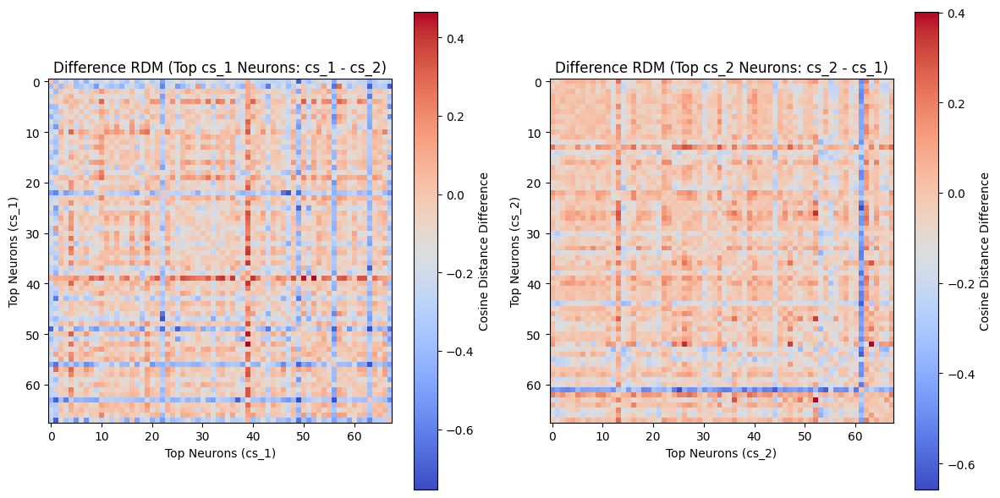

In [17]:
# Step 1: Compute the difference RDMs
difference_rdm_cs_1 = rdm_top_cs_1_neurons_cs_1 - rdm_top_cs_1_neurons_cs_2
difference_rdm_cs_2 = rdm_top_cs_2_neurons_cs_2 - rdm_top_cs_2_neurons_cs_1

# Step 2: Visualize the difference RDMs
plt.figure(figsize=(12, 6))

# Difference RDM for top cs_1 neurons
plt.subplot(1, 2, 1)
plt.title("Difference RDM (Top cs_1 Neurons: cs_1 - cs_2)")
plt.imshow(difference_rdm_cs_1, cmap='coolwarm', interpolation='none')
plt.colorbar(label="Cosine Distance Difference")
plt.xlabel("Top Neurons (cs_1)")
plt.ylabel("Top Neurons (cs_1)")

# Difference RDM for top cs_2 neurons
plt.subplot(1, 2, 2)
plt.title("Difference RDM (Top cs_2 Neurons: cs_2 - cs_1)")
plt.imshow(difference_rdm_cs_2, cmap='coolwarm', interpolation='none')
plt.colorbar(label="Cosine Distance Difference")
plt.xlabel("Top Neurons (cs_2)")
plt.ylabel("Top Neurons (cs_2)")

plt.tight_layout()
plt.show()


In [18]:
print(top_1_percent_cs_1_neurons)
print(top_1_percent_cs_2_neurons)

# Convert top responsive indices to sets
cs1_top_set = set(top_1_percent_cs_1_neurons)
cs2_top_set = set(top_1_percent_cs_2_neurons)

# Find cells present in both CS1 and CS2 top sets
shared_cells = cs1_top_set & cs2_top_set  # Intersection

# Find cells unique to CS1
unique_to_cs1 = cs1_top_set - cs2_top_set  # Difference (CS1 only)

# Find cells unique to CS2
unique_to_cs2 = cs2_top_set - cs1_top_set  # Difference (CS2 only)

# Convert sets back to sorted lists for consistency
shared_cells = sorted(shared_cells)
unique_to_cs1 = sorted(unique_to_cs1)
unique_to_cs2 = sorted(unique_to_cs2)

print("Cells responsive to both CS1 and CS2:", shared_cells)
print("Cells responsive only to CS1:", unique_to_cs1)
print("Cells responsive only to CS2:", unique_to_cs2)

print(len(shared_cells))
print(len(unique_to_cs2))


Index([2886, 2966,  152, 4687, 3005,  147, 2991,  203, 3006,  580, 5742, 3161,
        521,  328,  245, 5284, 5345,  488,   66, 4849, 4881,  491, 3039,  300,
       4685,  415,  306, 3535, 4993, 5028, 1038, 3827, 5149, 3498,  475, 5393,
       5024,  654, 1261,  388, 3627, 3611, 2963, 1225, 5615, 2009, 5045, 5447,
       3631, 5409, 4059, 1872, 1585, 4671, 4899, 5449, 1388, 5327, 3934, 3517,
       3483, 4110, 3124,  990,  777, 4794, 1411,  843],
      dtype='int64')
Index([  59, 2889,  112, 3124, 4720,  331,  271, 5046, 3010, 2984,  330, 2991,
        692, 5007,  490, 2962, 3486, 3015, 1057,  306, 2406,  505, 3772, 4775,
       3161,  121,   95,  548, 1474, 3417, 3402, 4699, 2905,  784, 4827, 5088,
       3240,  475, 4773, 2909,  409,  491, 1122, 1913, 5364, 4800, 4843,  328,
       3515, 3757, 3609,  663, 5663, 5208, 4877, 3087, 3803, 2932, 3551, 6755,
       1131, 5015, 4358,  603, 3627, 1370, 2760, 1022],
      dtype='int64')
Cells responsive to both CS1 and CS2: [306, 328, 475, 49

(6779, 104)
(6779, 68, 104)


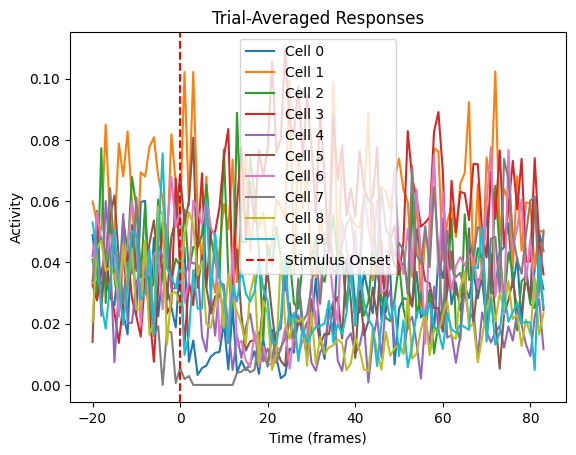

In [19]:
#determining good response window to capture cs1 and cs2 response vectors
activity = norm_moving_deconvolved_filtered
index_frames = []
num_trials = 0
trial_times = behavior['onsets'][behavior['cue_codes'] == behavior['cs_1_code']] #or cs_2
for i in trial_times:
    if i > 0:
        num_trials = num_trials + 1
        for j in range(-behavior['frames_before'], behavior['frames_after']):
            index_frames.append(int(i) + j)

activity_task_idx = activity[:, index_frames]
activity_task_idx = np.reshape(activity_task_idx, (activity_task_idx.shape[0], num_trials,
                                                    behavior['frames_before'] + behavior['frames_after']))

activity_avg = activity_task_idx.mean(axis=1)  # Mean over trials
print(activity_avg.shape)
print(activity_task_idx.shape)

time_points = np.arange(-behavior['frames_before'], behavior['frames_after'])

# Plot average responses for a few example cells
for i in range(10):  # Plot the first 5 cells
    plt.plot(time_points, activity_avg[i, :], label=f'Cell {i}')
plt.axvline(x=0, color='red', linestyle='--', label='Stimulus Onset')
plt.title("Trial-Averaged Responses")
plt.xlabel("Time (frames)")
plt.ylabel("Activity")
plt.legend()
plt.show()

In [20]:
print(len(top_10_percent_cs_1_neurons))
print(len(top_10_percent_cs_2_neurons))

print(len(top_1_percent_cs_1_neurons))
print(len(top_1_percent_cs_2_neurons))


678
678
68
68


In [21]:
# Assuming top_1_percent_cs_1_neurons contains the indices of top neurons
top_neuron_indices1 = top_1_percent_cs_1_neurons  # Indices of top neurons
top_neuron_indices2 = top_1_percent_cs_2_neurons  # Indices of top neurons

# Extract trial-averaged activity for the top 1% neurons
top_neuron_activity_avg1 = activity_avg[top_neuron_indices1, :]  # Subset rows for top neurons
top_neuron_activity_avg2 = activity_avg[top_neuron_indices2, :]  # Subset rows for top neurons

top_neuron_activity_window1 = top_neuron_activity_avg1[:, start_frame:end_frame]
top_neuron_activity_window2 = top_neuron_activity_avg2[:, start_frame:end_frame]

# Print the activity for the top 1% neurons in the specified time window
print("Activity of Top 1% Neurons (0-10 Frames Post-Stimulus):")
print(top_neuron_activity_window1.shape)
print(top_neuron_activity_window2.shape)

print(top_neuron_activity_window1.min(), top_neuron_activity_window1.max())
print(top_neuron_activity_window2.min(), top_neuron_activity_window2.max())

Activity of Top 1% Neurons (0-10 Frames Post-Stimulus):
(68, 10)
(68, 10)
0.00811667471653614 0.8026435962195582
0.0021860953966298217 0.7158881595623625


In [22]:
top_neuron_indices10 = top_10_percent_cs_1_neurons  # Indices of top neurons
top_neuron_indices20 = top_10_percent_cs_2_neurons  # Indices of top neurons

# Extract trial-averaged activity for the top 1% neurons
top_neuron_activity_avg10 = activity_avg[top_neuron_indices10, :]  # Subset rows for top neurons
top_neuron_activity_avg20 = activity_avg[top_neuron_indices20, :]  # Subset rows for top neurons

top_neuron_activity_window10 = top_neuron_activity_avg10[:, start_frame:end_frame]
top_neuron_activity_window20 = top_neuron_activity_avg20[:, start_frame:end_frame]

# Print the activity for the top 1% neurons in the specified time window
print("Activity of Top 1% Neurons (0-10 Frames Post-Stimulus):")
print(top_neuron_activity_window10.shape)
print(top_neuron_activity_window20.shape)

print(top_neuron_activity_window10.min(), top_neuron_activity_window10.max())
print(top_neuron_activity_window20.min(), top_neuron_activity_window20.max())

Activity of Top 1% Neurons (0-10 Frames Post-Stimulus):
(678, 10)
(678, 10)
0.005956700192548039 0.8026435962195582
0.0021860953966298217 0.7158881595623625


In [23]:
print(top_neuron_activity_window1[:5, ])

[[0.05255677 0.05713599 0.31010334 0.58742999 0.43009147 0.37979935
  0.21194866 0.19600942 0.18474155 0.18546913]
 [0.04703898 0.04524707 0.23424703 0.79808163 0.49735141 0.27220082
  0.22718811 0.12983569 0.14482023 0.13248997]
 [0.02959806 0.03074614 0.10569664 0.48753116 0.51686467 0.2712635
  0.31740254 0.29104085 0.20530078 0.25283914]
 [0.06597255 0.10084788 0.46391434 0.46841915 0.32193112 0.21944779
  0.21706175 0.21701883 0.21688315 0.16165227]
 [0.03292201 0.04445216 0.08225254 0.33502103 0.59645428 0.4777628
  0.31170425 0.23336788 0.11951506 0.13883095]]


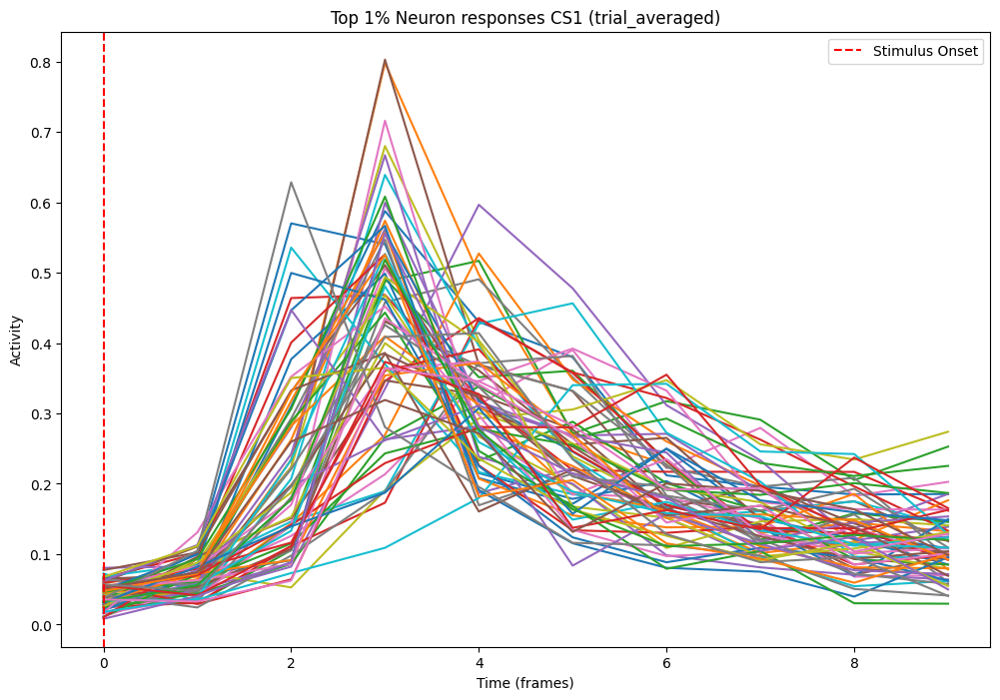

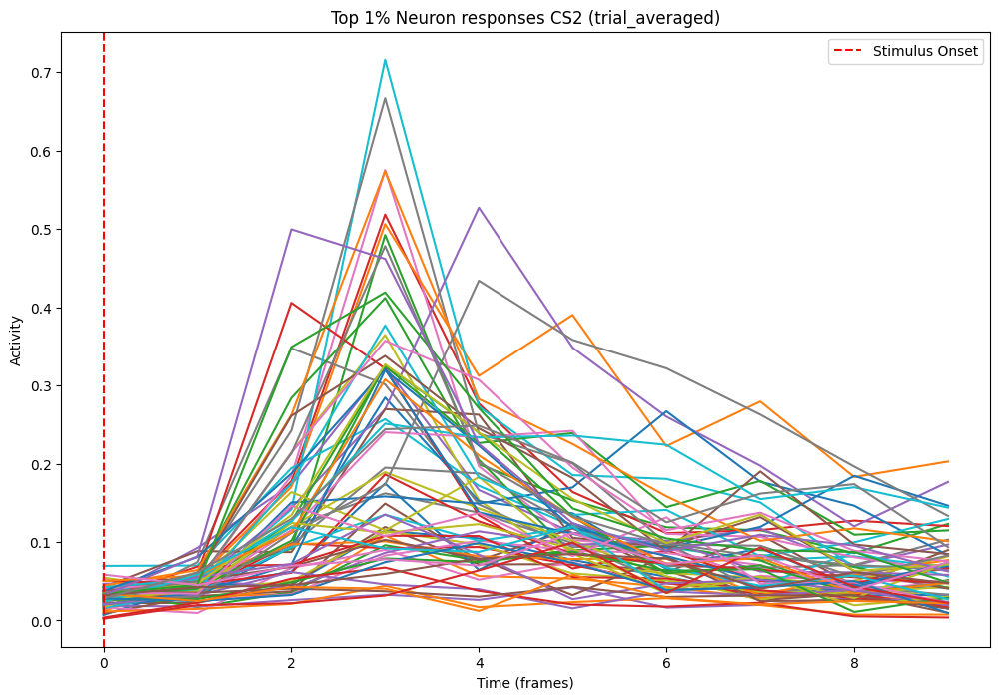

In [24]:
time_points = np.arange(10)
plt.figure(figsize=(12,8))
for i in range(len(top_neuron_activity_window1)):
    plt.plot(time_points, top_neuron_activity_window1[i, ])#, label = f'neuron {i}')
plt.axvline(x=0, color='red', linestyle='--', label='Stimulus Onset')
plt.title("Top 1% Neuron responses CS1 (trial_averaged)")
plt.xlabel("Time (frames)")
plt.ylabel("Activity")
plt.legend()
plt.show()


plt.figure(figsize =(12,8))
for i in range(len(top_neuron_activity_window2)):
    plt.plot(time_points, top_neuron_activity_window2[i, ])#, label = f'neuron {i}')
plt.axvline(x=0, color='red', linestyle='--', label='Stimulus Onset')
plt.title("Top 1% Neuron responses CS2 (trial_averaged)")
plt.xlabel("Time (frames)")
plt.ylabel("Activity")
plt.legend()
plt.show()

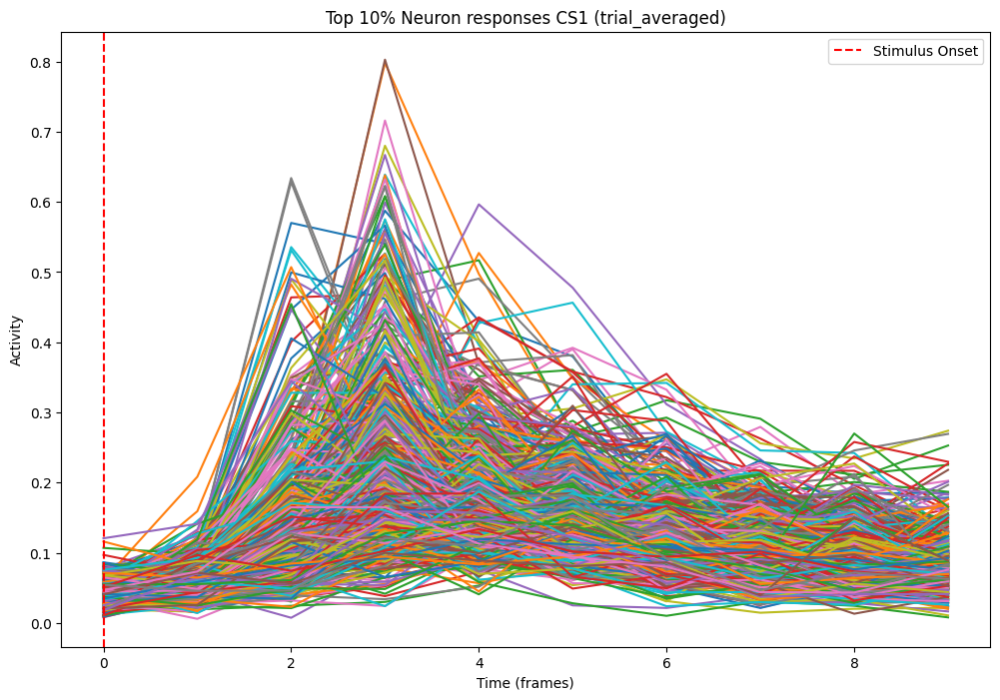

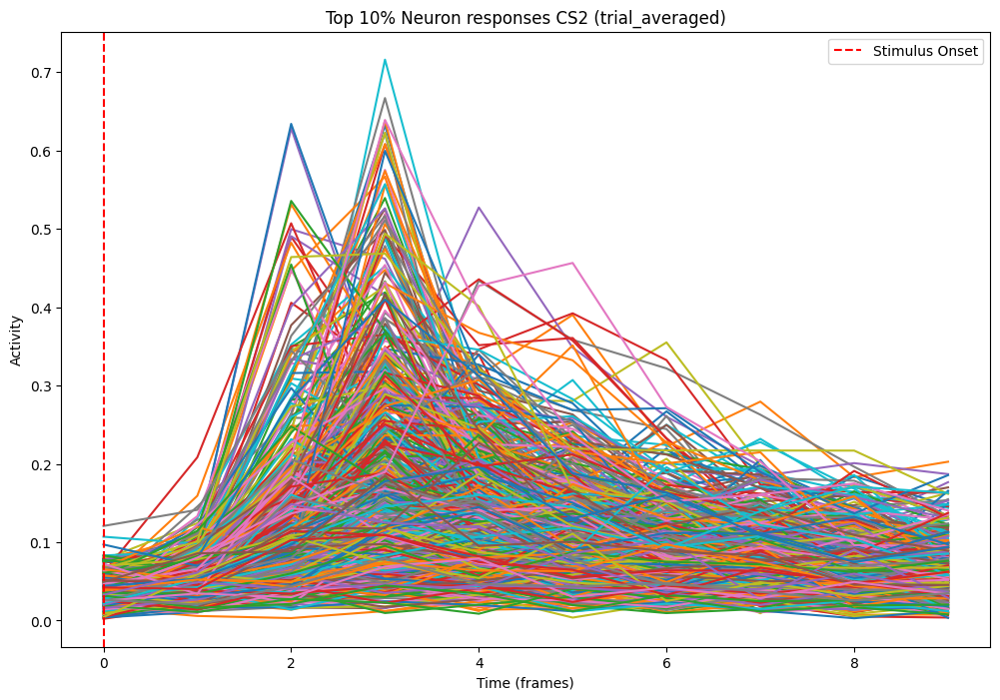

In [25]:
time_points = np.arange(10)
plt.figure(figsize=(12,8))
for i in range(len(top_neuron_activity_window10)):
    plt.plot(time_points, top_neuron_activity_window10[i, ])#, label = f'neuron {i}')
plt.axvline(x=0, color='red', linestyle='--', label='Stimulus Onset')
plt.title("Top 10% Neuron responses CS1 (trial_averaged)")
plt.xlabel("Time (frames)")
plt.ylabel("Activity")
plt.legend()
plt.show()


plt.figure(figsize =(12,8))
for i in range(len(top_neuron_activity_window20)):
    plt.plot(time_points, top_neuron_activity_window20[i, ])#, label = f'neuron {i}')
plt.axvline(x=0, color='red', linestyle='--', label='Stimulus Onset')
plt.title("Top 10% Neuron responses CS2 (trial_averaged)")
plt.xlabel("Time (frames)")
plt.ylabel("Activity")
plt.legend()
plt.show()

In [26]:
combined_matrix = np.column_stack((top_neuron_indices1, top_neuron_activity_window1))

# Create a DataFrame
matrix_top1_cs1 = pd.DataFrame(
    combined_matrix,
    columns=["Neuron Index"] + [f"Frame {i}" for i in range(top_neuron_activity_window1.shape[1])]
)

combined_matrix = np.column_stack((top_neuron_indices2, top_neuron_activity_window2))

# Create a DataFrame
matrix_top1_cs2 = pd.DataFrame(
    combined_matrix,
    columns=["Neuron Index"] + [f"Frame {i}" for i in range(top_neuron_activity_window1.shape[1])]
)

print(matrix_top1_cs1.head())
print(matrix_top1_cs2.head())


   Neuron Index   Frame 0   Frame 1   Frame 2   Frame 3   Frame 4   Frame 5  \
0        2886.0  0.052557  0.057136  0.310103  0.587430  0.430091  0.379799   
1        2966.0  0.047039  0.045247  0.234247  0.798082  0.497351  0.272201   
2         152.0  0.029598  0.030746  0.105697  0.487531  0.516865  0.271264   
3        4687.0  0.065973  0.100848  0.463914  0.468419  0.321931  0.219448   
4        3005.0  0.032922  0.044452  0.082253  0.335021  0.596454  0.477763   

    Frame 6   Frame 7   Frame 8   Frame 9  
0  0.211949  0.196009  0.184742  0.185469  
1  0.227188  0.129836  0.144820  0.132490  
2  0.317403  0.291041  0.205301  0.252839  
3  0.217062  0.217019  0.216883  0.161652  
4  0.311704  0.233368  0.119515  0.138831  
   Neuron Index   Frame 0   Frame 1   Frame 2   Frame 3   Frame 4   Frame 5  \
0          59.0  0.006885  0.045979  0.045391  0.114197  0.104552  0.077037   
1        2889.0  0.037951  0.029921  0.033735  0.108025  0.056506  0.053232   
2         112.0  0.03010

In [27]:
activity = norm_moving_deconvolved_filtered
index_frames = []
num_trials = 0
#for plotting top 1% responding to own stimulus
#cs_1_trials = behavior['onsets'][behavior['cue_codes'] == behavior['cs_1_code']]
#cs_2_trials = behavior['onsets'][behavior['cue_codes'] == behavior['cs_2_code']]

#for plotting top 1% responding to other stimulus
cs_1_trials = behavior['onsets'][behavior['cue_codes'] == behavior['cs_2_code']]
cs_2_trials = behavior['onsets'][behavior['cue_codes'] == behavior['cs_1_code']]

for i in cs_1_trials:
    if i > 0:
        num_trials = num_trials + 1
        for j in range(-behavior['frames_before'], behavior['frames_after']):
            index_frames.append(int(i) + j)
activity_task_idx = activity[:, index_frames]
activity_task_idx = np.reshape(activity_task_idx, (activity_task_idx.shape[0], num_trials,
                                                    behavior['frames_before'] + behavior['frames_after']))

# Extract the activity of top neurons for both conditions
cs_1_activity_top1 = activity_task_idx[top_neuron_indices1, :, :]

index_frames = []
num_trials = 0
for i in cs_2_trials:
    if i > 0:
        num_trials = num_trials + 1
        for j in range(-behavior['frames_before'], behavior['frames_after']):
            index_frames.append(int(i) + j)
activity_task_idx = activity[:, index_frames]

activity_task_idx = np.reshape(activity_task_idx, (activity_task_idx.shape[0], num_trials,
                                                    behavior['frames_before'] + behavior['frames_after']))
cs_2_activity_top1 = activity_task_idx[top_neuron_indices2, :, :]


In [28]:
print(cs_1_activity_top1.shape)
print(cs_2_activity_top1.shape)


(68, 60, 104)
(68, 68, 104)


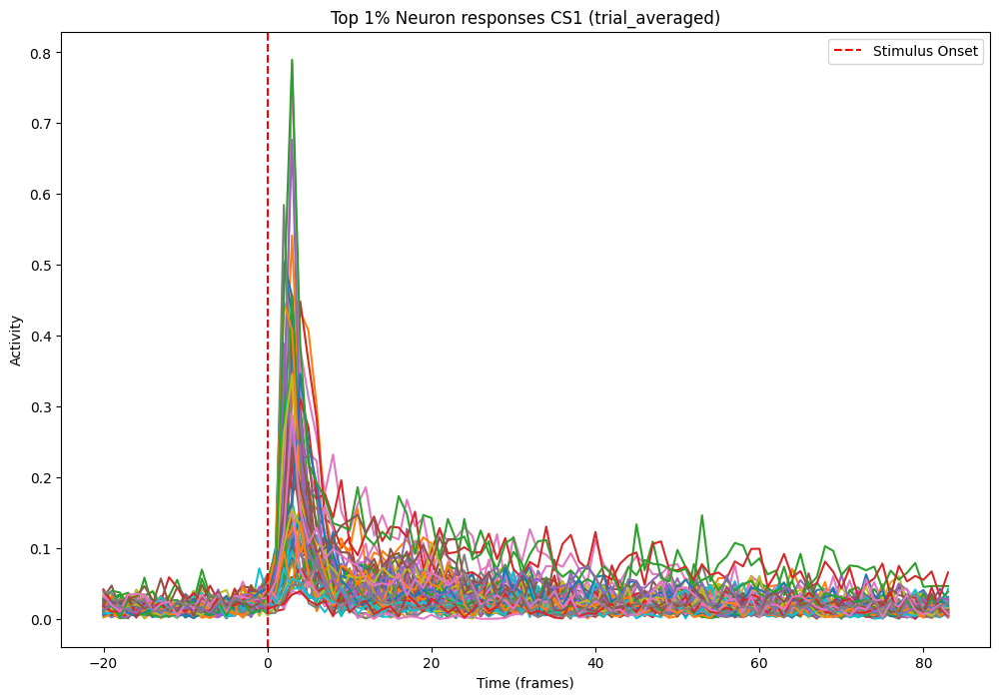

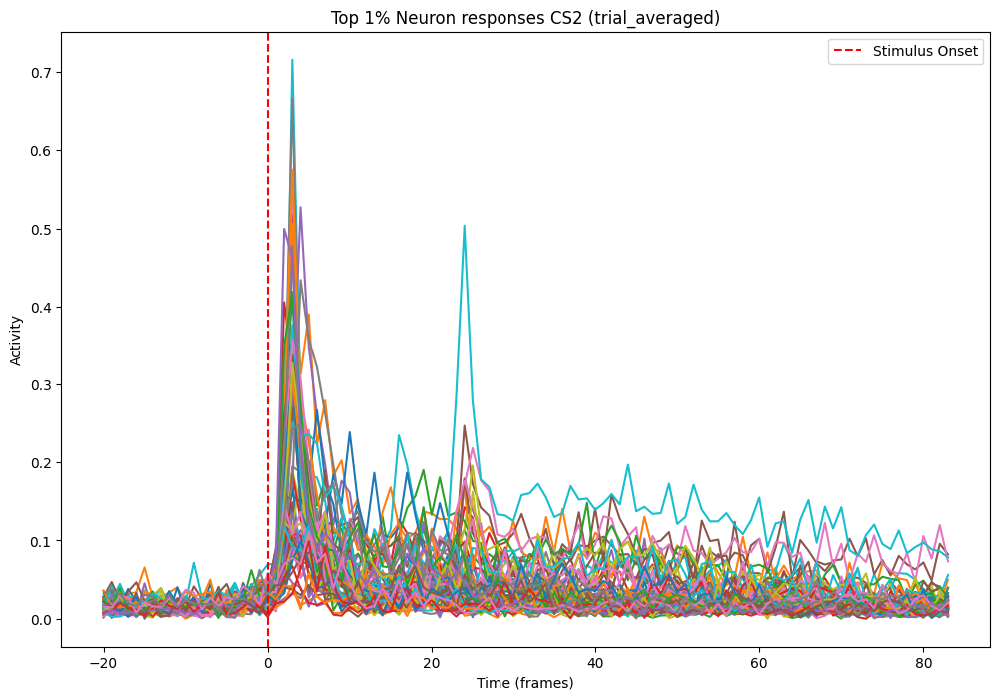

In [29]:
time_points = np.arange(-behavior['frames_before'], behavior['frames_after'])
mean_activity_per_neuron = cs_1_activity_top1.mean(axis=1)

plt.figure(figsize=(12,8))
for i in range(len(mean_activity_per_neuron)):
    plt.plot(time_points, mean_activity_per_neuron[i, ])#, label = f'neuron {i}')
plt.axvline(x=0, color='red', linestyle='--', label='Stimulus Onset')
plt.title("Top 1% Neuron responses CS1 (trial_averaged)")
plt.xlabel("Time (frames)")
plt.ylabel("Activity")
plt.legend()
plt.show()

mean_activity_per_neuron = cs_2_activity_top1.mean(axis=1)

plt.figure(figsize =(12,8))
for i in range(len(mean_activity_per_neuron)):
    plt.plot(time_points, mean_activity_per_neuron[i, ])#, label = f'neuron {i}')
plt.axvline(x=0, color='red', linestyle='--', label='Stimulus Onset')
plt.title("Top 1% Neuron responses CS2 (trial_averaged)")
plt.xlabel("Time (frames)")
plt.ylabel("Activity")
plt.legend()
plt.show()

In [30]:
print(top_neuron_activity_window1.shape)
print(top_neuron_activity_window2.shape)
print(norm_moving_deconvolved_filtered.shape)



(68, 10)
(68, 10)
(6779, 106665)


In [31]:
from sklearn.decomposition import PCA
from scipy.spatial.distance import cdist
import numpy as np

# Dimensions of the dataset
num_neurons, num_frames = norm_moving_deconvolved_filtered.shape

# Initialize PCA
pca = PCA(n_components=5)
pattern_pca = pca.fit_transform(top_neuron_activity_window1)  # PCA on the pattern
print(pca.explained_variance_ratio_)


# Sliding window parameters
window_size = 10  # Match the pattern window size
stride = 1  # Stride for sliding window
similarities = []  # Store similarity values
indices = []  # Store matched indices

# Perform sliding window analysis
for start in range(0, num_frames - window_size + 1, stride):
    # Extract the block of shape (num_neurons, window_size)
    block = norm_moving_deconvolved_filtered[:, start:start + window_size]
    
    # Apply PCA to the block
    block_pca = pca.transform(block)
    
    # Compute similarity between the pattern and the current block
    similarity = 1 - cdist([pattern_pca.mean(axis=0)], [block_pca.mean(axis=0)], metric='cosine')
    similarities.append(similarity[0][0])
    indices.append(start)

# Find indices of blocks with high similarity
threshold = 0.35  # Similarity threshold
high_similarity_indices = [indices[i] for i, sim in enumerate(similarities) if sim > threshold]

print("High similarity blocks found at frame indices:", high_similarity_indices)



[0.49466514 0.26918298 0.08753859 0.06118055 0.03905106]


High similarity blocks found at frame indices: [21283, 21284, 21326, 21327, 21827, 21828, 21829, 21830, 22451, 23069, 23070, 23071, 23688, 23689, 24311, 25547, 26789, 26790, 31145, 45538, 64479, 64480, 66338, 66339, 68193, 104349, 104350, 104351, 105531, 105532, 106655]


In [32]:
print(len(high_similarity_indices))

31


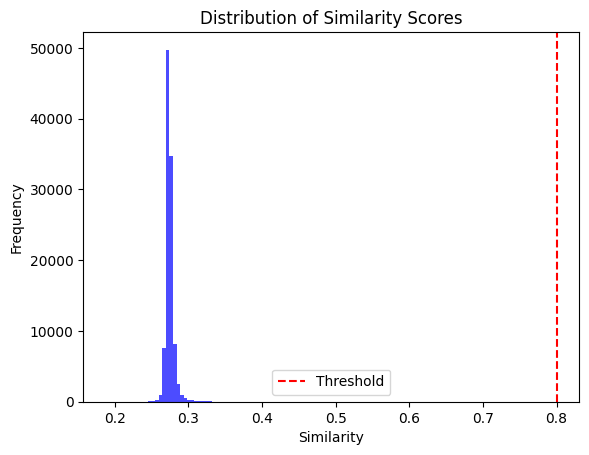

In [33]:
plt.hist(similarities, bins=50, color='blue', alpha=0.7)
plt.title("Distribution of Similarity Scores")
plt.xlabel("Similarity")
plt.ylabel("Frequency")
plt.axvline(x=0.8, color='red', linestyle='--', label='Threshold')
plt.legend()
plt.show()

In [34]:
#yikes nice try

In [35]:
print(idx.keys())
print(prior)

dict_keys(['cs_1', 'cs_2', 'cs_1_df', 'cs_2_df', 'both', 'all'])
0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
106660    0.0
106661    0.0
106662    0.0
106663    0.0
106664    0.0
Length: 106665, dtype: float64


In [36]:
print(y_pred.shape)

(106665, 2)


1939.0
1693.0


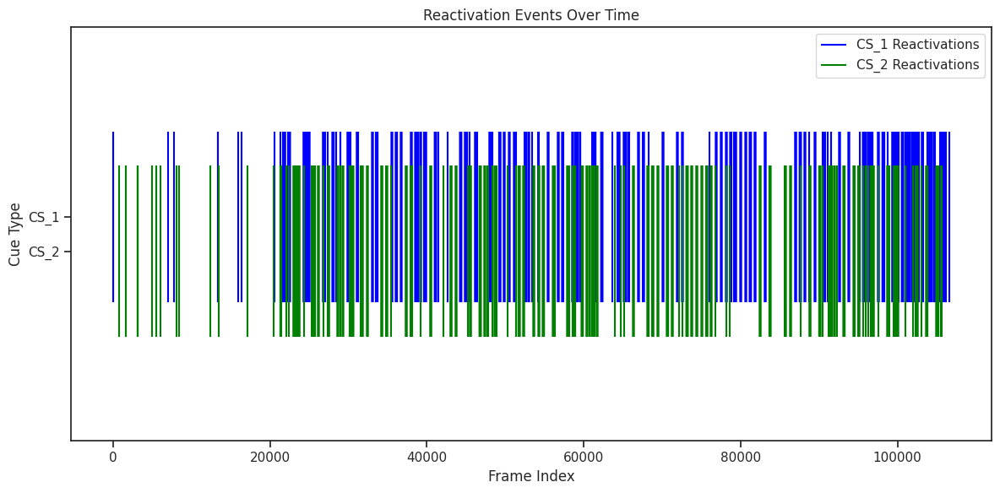

In [74]:
print(y_pred[:, 0].sum())
print(y_pred[:, 1].sum())

# Assuming y_pred_final is the final output (binary reactivations)
frames = np.arange(len(y_pred))  # Frame indices (x-axis)

plt.figure(figsize=(12, 6))
plt.eventplot(frames[y_pred[:, 0] == 1], lineoffsets=0.8, color='blue', label='CS_1 Reactivations')
plt.eventplot(frames[y_pred[:, 1] == 1], lineoffsets=0.6, color='green', label='CS_2 Reactivations')

plt.title("Reactivation Events Over Time")
plt.xlabel("Frame Index")
plt.ylabel("Cue Type")
plt.yticks([0.6, 0.8], ['CS_2', 'CS_1'])
plt.legend()
plt.tight_layout()
plt.show()



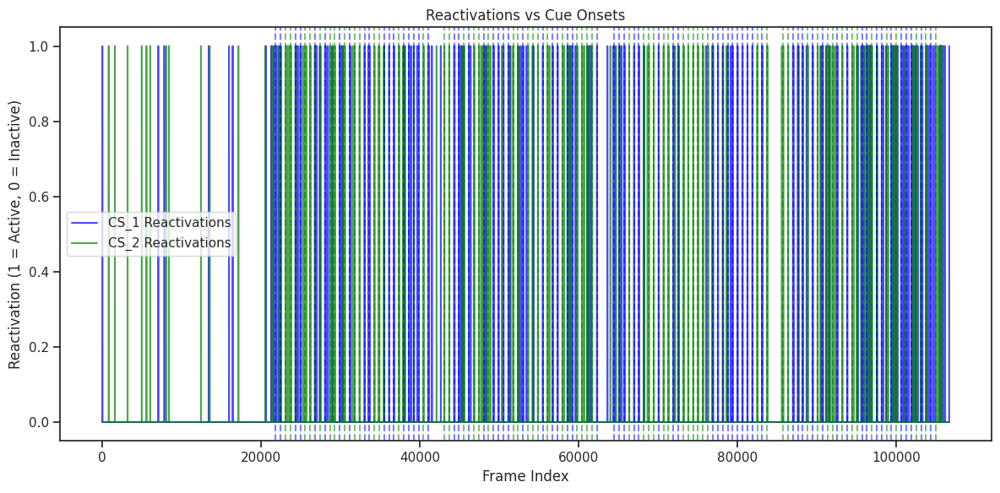

In [76]:
cue_onsets_cs_1 = behavior['onsets'][behavior['cue_codes'] == behavior['cs_1_code']]
cue_onsets_cs_2 = behavior['onsets'][behavior['cue_codes'] == behavior['cs_2_code']]

plt.figure(figsize=(12, 6))

# Reactivations
plt.plot(frames, y_pred[:, 0], label='CS_1 Reactivations', color='blue', alpha=0.7)
plt.plot(frames, y_pred[:, 1], label='CS_2 Reactivations', color='green', alpha=0.7)

# Cue Onsets
for onset in cue_onsets_cs_1:
    plt.axvline(x=onset, color='blue', linestyle='--', alpha=0.5)#, label='CS_1 Cue Onset')
for onset in cue_onsets_cs_2:
    plt.axvline(x=onset, color='green', linestyle='--', alpha=0.5)#, label='CS_2 Cue Onset')

plt.title("Reactivations vs Cue Onsets")
plt.xlabel("Frame Index")
plt.ylabel("Reactivation (1 = Active, 0 = Inactive)")
plt.legend()
plt.tight_layout()
plt.show()


In [85]:
# Total reactivations for cs_1
cs_1_reactivations = np.sum(y_pred[:, 0])  # Sum column 0

# Total reactivations for cs_2
cs_2_reactivations = np.sum(y_pred[:, 1])  # Sum column 1

print(f"Total Reactivations for CS_1: {cs_1_reactivations}")
print(f"Total Reactivations for CS_2: {cs_2_reactivations}")


frame_rate = behavior["framerate"]  # Number of frames per second

# Reactivation frequency for cs_1
cs_1_frequency = cs_1_reactivations / (len(y_pred) / frame_rate)

# Reactivation frequency for cs_2
cs_2_frequency = cs_2_reactivations / (len(y_pred) / frame_rate)

print(f"Reactivation Frequency for CS_1: {cs_1_frequency} Hz")
print(f"Reactivation Frequency for CS_2: {cs_2_frequency} Hz")

# Binary arrays indicating frames with reactivations
cs_1_binary = y_pred[:, 0]
cs_2_binary = y_pred[:, 1]

# Statistics for CS_1
cs_1_mean = np.mean(cs_1_binary)  # Fraction of frames with reactivations
cs_1_variance = np.var(cs_1_binary)

# Statistics for CS_2
cs_2_mean = np.mean(cs_2_binary)
cs_2_variance = np.var(cs_2_binary)

print(f"CS_1 Reactivation Mean: {cs_1_mean:.2f}, Variance: {cs_1_variance:.2f}")
print(f"CS_2 Reactivation Mean: {cs_2_mean:.2f}, Variance: {cs_2_variance:.2f}")




Total Reactivations for CS_1: 1939.0
Total Reactivations for CS_2: 1693.0
Reactivation Frequency for CS_1: [[0.18935843]] Hz
Reactivation Frequency for CS_2: [[0.16533461]] Hz
CS_1 Reactivation Mean: 0.02, Variance: 0.02
CS_2 Reactivation Mean: 0.02, Variance: 0.02


In [101]:
# Reactivation frames for CS_1 and CS_2
cs_1_frames = np.where(y_pred[:, 0] == 1)[0]
cs_2_frames = np.where(y_pred[:, 1] == 1)[0]

print(f"Reactivation frames for CS_1: {cs_1_frames}")
print(f"Reactivation frames for CS_2: {cs_2_frames}")

# Neural activity during CS_1 reactivations
cs_1_neural_activity = norm_moving_deconvolved_filtered[:, cs_1_frames]

# Neural activity during CS_2 reactivations
cs_2_neural_activity = norm_moving_deconvolved_filtered[:, cs_2_frames]

print(f"Shape of CS_1 activity: {cs_1_neural_activity.shape}")
print(f"Shape of CS_2 activity: {cs_2_neural_activity.shape}")

Reactivation frames for CS_1: [     1      3   7039 ... 105964 106138 106664]
Reactivation frames for CS_2: [   813   1578   1579 ... 105506 105542 105696]
Shape of CS_1 activity: (6779, 1939)
Shape of CS_2 activity: (6779, 1693)


In [ ]:
# Mean activity across reactivation frames for each neuron
cs_1_mean_activity = cs_1_neural_activity.mean(axis=1)
cs_2_mean_activity = cs_2_neural_activity.mean(axis=1)

print(cs_1_mean_activity,cs_2_mean_activity)

# Calculate 90th percentile threshold for significant activity
cs_1_threshold = np.percentile(cs_1_mean_activity, 95)
cs_2_threshold = np.percentile(cs_2_mean_activity, 95)

print(f"CS_1 Activity Threshold (95th Percentile): {cs_1_threshold}")
print(f"CS_2 Activity Threshold (95th Percentile): {cs_2_threshold}")

# Neurons in the top 10% for CS_1 and CS_2
cs_1_top_neurons = np.where(cs_1_mean_activity >= cs_1_threshold)[0]
cs_2_top_neurons = np.where(cs_2_mean_activity >= cs_2_threshold)[0]

print(f"Top 10% Neurons for CS_1: {cs_1_top_neurons}")
print(f"Top 10% Neurons for CS_2: {cs_2_top_neurons}")




[0.01310033 0.0608814  0.04777526 ... 0.02063454 0.02041106 0.05757957] [0.00989178 0.05631397 0.07955984 ... 0.01714418 0.01746999 0.03583717]
CS_1 Activity Threshold (90th Percentile): 0.07984349368887551
CS_2 Activity Threshold (90th Percentile): 0.07629019639813332
Top 10% Neurons for CS_1: [  21   32   66   74  112  143  147  152  162  203  233  244  245  252
  266  272  283  288  292  300  302  305  306  314  328  343  381  388
  395  401  409  415  416  421  453  456  475  488  491  494  507  513
  521  543  566  580  636  651  654  664  680  694  709  737  772  777
  796  811  814  843  867  919  937  939  968  990  992 1022 1038 1096
 1104 1146 1188 1225 1237 1261 1263 1302 1310 1311 1322 1349 1368 1376
 1411 1419 1422 1426 1443 1471 1498 1510 1515 1516 1571 1584 1585 1592
 1596 1640 1647 1654 1662 1720 1721 1788 1815 1820 1831 1872 1899 1969
 1973 2003 2009 2025 2039 2074 2106 2134 2192 2206 2210 2226 2287 2302
 2342 2364 2400 2418 2423 2438 2553 2649 2664 2674 2695 2738 2808

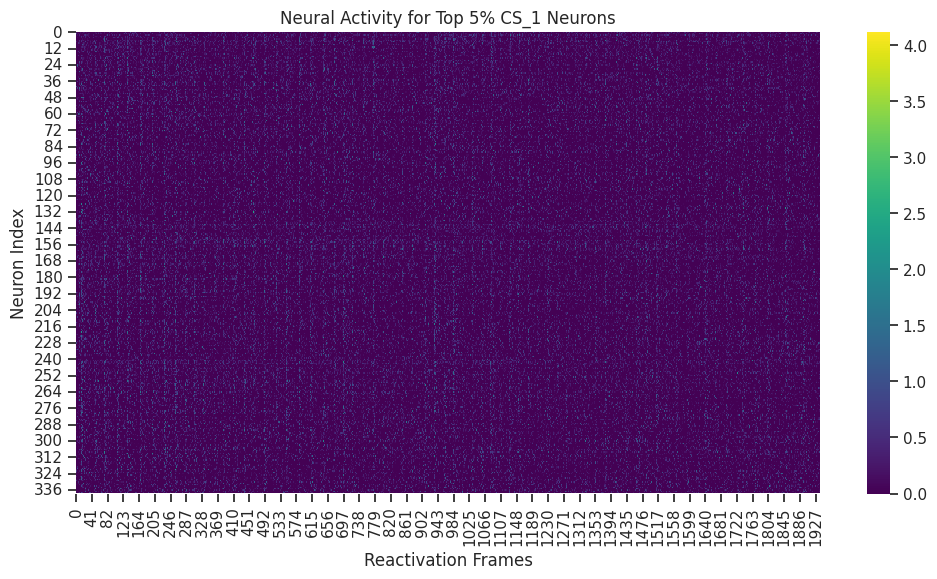

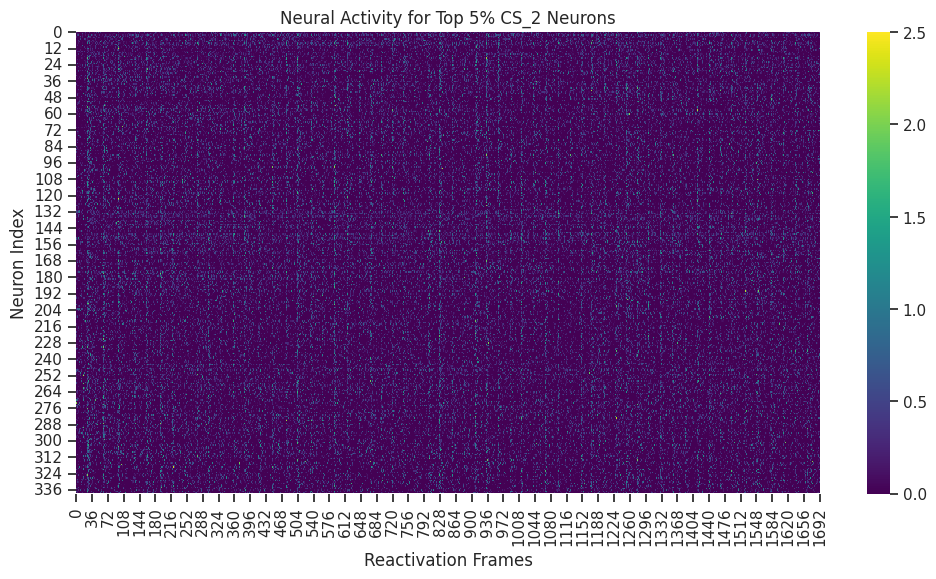

In [108]:
# Heatmap for top CS_1 neurons
plt.figure(figsize=(12, 6))
sns.heatmap(cs_1_neural_activity[cs_1_top_neurons, :], cmap='viridis', cbar=True)
plt.title("Neural Activity for Top 5% CS_1 Neurons")
plt.xlabel("Reactivation Frames")
plt.ylabel("Neuron Index")
plt.show()

# Heatmap for top CS_2 neurons
plt.figure(figsize=(12, 6))
sns.heatmap(cs_2_neural_activity[cs_2_top_neurons, :], cmap='viridis', cbar=True)
plt.title("Neural Activity for Top 5% CS_2 Neurons")
plt.xlabel("Reactivation Frames")
plt.ylabel("Neuron Index")
plt.show()



# Vector analysis

In [109]:
# Mean reactivation vectors for CS_1 and CS_2
cs_1_mean_vector = cs_1_neural_activity.mean(axis=1)
cs_2_mean_vector = cs_2_neural_activity.mean(axis=1)

# Reactivation vectors (each column corresponds to a frame)
cs_1_reactivation_vectors = cs_1_neural_activity
cs_2_reactivation_vectors = cs_2_neural_activity



In [110]:
from scipy.spatial.distance import cosine, euclidean

# Cosine similarity
cs_1_cosine_similarities = 1 - np.apply_along_axis(lambda v: cosine(v, cs_1_mean_vector), 0, cs_1_reactivation_vectors)
cs_2_cosine_similarities = 1 - np.apply_along_axis(lambda v: cosine(v, cs_2_mean_vector), 0, cs_2_reactivation_vectors)

# Correlation
cs_1_correlations = np.apply_along_axis(lambda v: pearsonr(v, cs_1_mean_vector)[0], 0, cs_1_reactivation_vectors)
cs_2_correlations = np.apply_along_axis(lambda v: pearsonr(v, cs_2_mean_vector)[0], 0, cs_2_reactivation_vectors)

# Euclidean distance
cs_1_euclidean_distances = np.apply_along_axis(lambda v: euclidean(v, cs_1_mean_vector), 0, cs_1_reactivation_vectors)
cs_2_euclidean_distances = np.apply_along_axis(lambda v: euclidean(v, cs_2_mean_vector), 0, cs_2_reactivation_vectors)



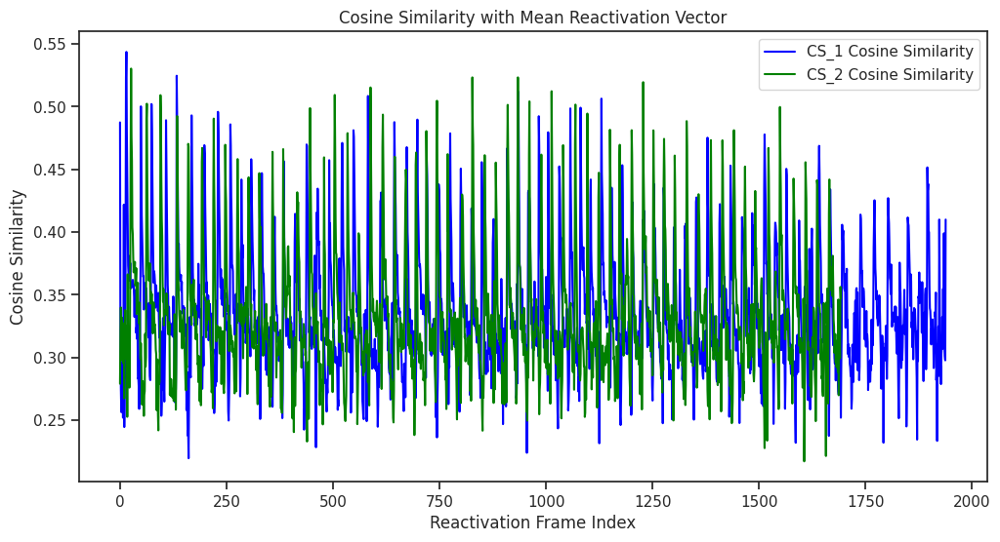

In [111]:
# Line plot for cosine similarity
plt.figure(figsize=(12, 6))
plt.plot(cs_1_cosine_similarities, label="CS_1 Cosine Similarity", color="blue")
plt.plot(cs_2_cosine_similarities, label="CS_2 Cosine Similarity", color="green")
plt.title("Cosine Similarity with Mean Reactivation Vector")
plt.xlabel("Reactivation Frame Index")
plt.ylabel("Cosine Similarity")
plt.legend()
plt.show()


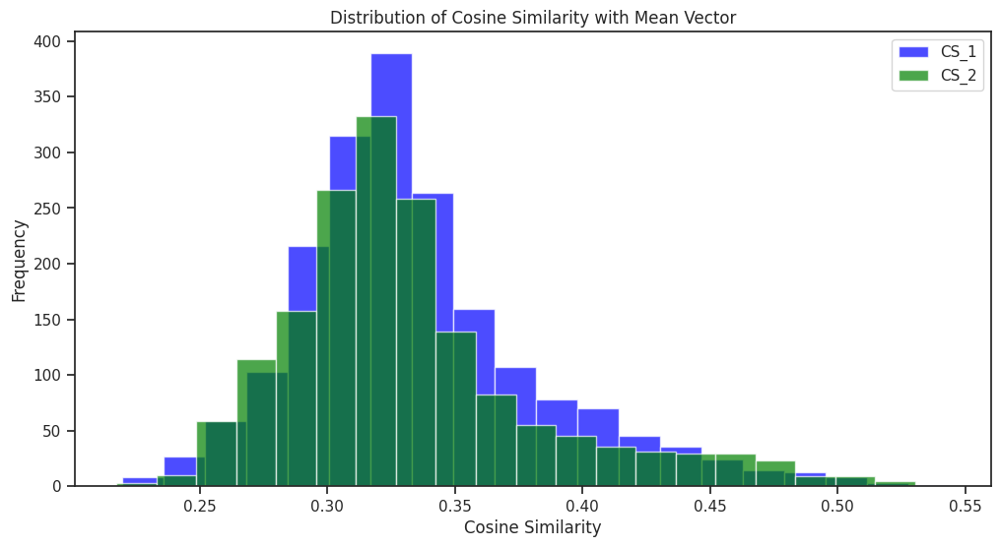

In [112]:
# Histogram for cosine similarity
plt.figure(figsize=(12, 6))
plt.hist(cs_1_cosine_similarities, bins=20, alpha=0.7, label="CS_1", color="blue")
plt.hist(cs_2_cosine_similarities, bins=20, alpha=0.7, label="CS_2", color="green")
plt.title("Distribution of Cosine Similarity with Mean Vector")
plt.xlabel("Cosine Similarity")
plt.ylabel("Frequency")
plt.legend()
plt.show()


In [116]:
#visualize how the stimulus-evoked reactivations (target) change over time
# visualize how the directly followed reactivation after the stimulus matches the actual stimulus
# visualize how directly followed reactivation changes over time 
# visualize the most active neurons in this??? 

In [118]:
# Extract stimulus onsets for CS_1 and CS_2
cs_1_onsets = behavior["onsets"][behavior["cue_codes"] == behavior["cs_1_code"]]
cs_2_onsets = behavior["onsets"][behavior["cue_codes"] == behavior["cs_2_code"]]

print(f"CS_1 Onsets: {cs_1_onsets}")
print(f"CS_2 Onsets: {cs_2_onsets}")

# Define the response window (e.g., 10 frames before and 20 frames after)
frames_before = 10
frames_after = 20

# Extract response vectors for CS_1
cs_1_response_vectors = []
for onset in cs_1_onsets:
    start_frame = onset - frames_before
    end_frame = onset + frames_after
    if start_frame >= 0 and end_frame < norm_moving_deconvolved_filtered.shape[1]:
        response_vector = norm_moving_deconvolved_filtered[:, start_frame:end_frame]
        cs_1_response_vectors.append(response_vector)

# Convert to NumPy array (Neurons x Frames x Trials)
cs_1_response_vectors = np.stack(cs_1_response_vectors, axis=2)

# Extract response vectors for CS_2
cs_2_response_vectors = []
for onset in cs_2_onsets:
    start_frame = onset - frames_before
    end_frame = onset + frames_after
    if start_frame >= 0 and end_frame < norm_moving_deconvolved_filtered.shape[1]:
        response_vector = norm_moving_deconvolved_filtered[:, start_frame:end_frame]
        cs_2_response_vectors.append(response_vector)

cs_2_response_vectors = np.stack(cs_2_response_vectors, axis=2)

print(cs_1_response_vectors.shape ,cs_2_response_vectors.shape )


CS_1 Onsets: [ 21833  22456  24316  24938  26794  28041  29912  31150  33017  33641
  35490  36114  36734  37974  38594  39214  39834  41079  44306  44927
  46169  48031  49272  49890  50510  51130  52988  55471  56710  57329
  58572  59189  62294  64484  65107  65722  66962  67579  70058  71922
  72543  76902  77521  78136  78756  79370  79993  80617  81238  81862
  83106  86974  87597  88213  89459  90705  92570  93810  95671  96291
  97537  98153  99391 100628 101247 101869 103116 104355]
CS_2 Onsets: [ 23075  23694  25553  26170  27415  28662  29287  30529  31773  32391
  34255  34874  37353  40456  43058  43680  45544  46787  47411  48649
  51745  52371  53612  54231  54854  56088  57946  59808  60424  61050
  61676  66344  68199  68819  69439  70679  71302  73166  73790  74411
  75029  75655  76278  82484  83726  85735  86357  88837  90080  91328
  91949  93187  94426  95051  96912  98767 100010 102492 103733 104972]
(6779, 30, 68) (6779, 30, 60)


In [ ]:
# Pairwise differences for CS_1
cs_1_trial_differences = np.diff(cs_1_response_vectors, axis=2)  # Shape: (neurons, frames, trials-1)

# Pairwise differences for CS_2
cs_2_trial_differences = np.diff(cs_2_response_vectors, axis=2)  # Shape: (neurons, frames, trials-1)


TypeError: only integer scalar arrays can be converted to a scalar index

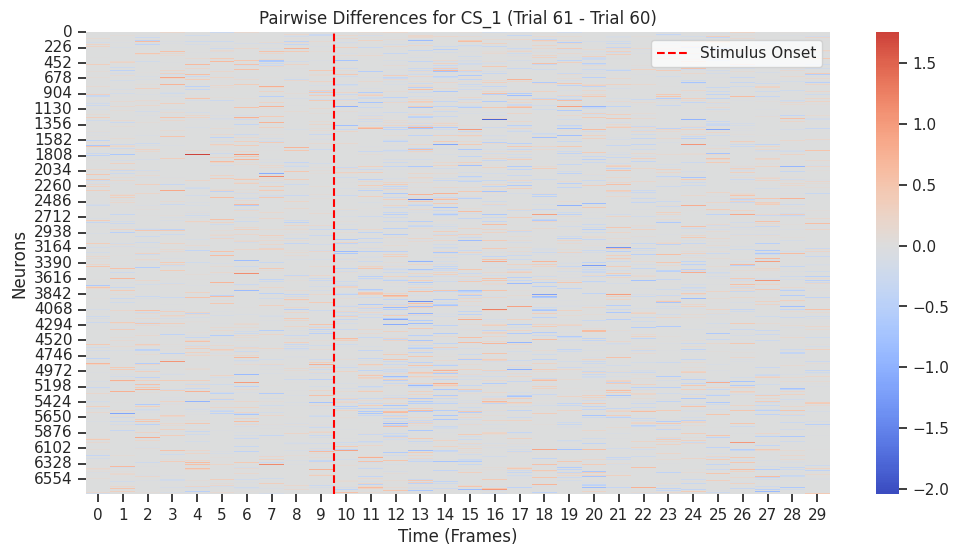

In [129]:
# Example: Heatmap of trial differences for CS_1 (first 10 trials)
trial_index = 60  # Select a trial index for visualization
plt.figure(figsize=(12, 6))
sns.heatmap(cs_1_trial_differences[:, :, trial_index], cmap="coolwarm", center=0, cbar=True)
plt.title(f"Pairwise Differences for CS_1 (Trial {trial_index+1} - Trial {trial_index})")
plt.xlabel("Time (Frames)")
plt.ylabel("Neurons")
plt.axvline(x=frames_before, color="red", linestyle="--", label="Stimulus Onset")
plt.legend()
plt.show()


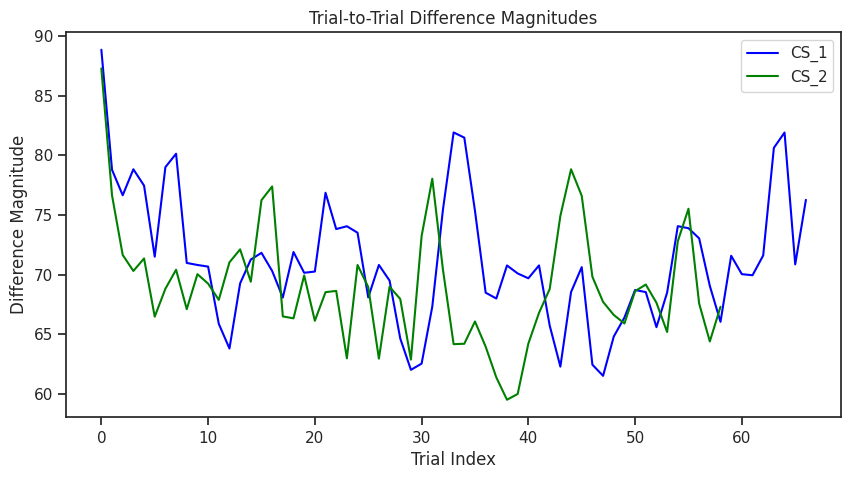

In [130]:
# Compute magnitude of differences (e.g., Frobenius norm across neurons and frames)
cs_1_difference_magnitude = np.linalg.norm(cs_1_trial_differences, axis=(0, 1))
cs_2_difference_magnitude = np.linalg.norm(cs_2_trial_differences, axis=(0, 1))

# Line plot for trial difference magnitudes
plt.figure(figsize=(10, 5))
plt.plot(cs_1_difference_magnitude, label="CS_1", color="blue")
plt.plot(cs_2_difference_magnitude, label="CS_2", color="green")
plt.title("Trial-to-Trial Difference Magnitudes")
plt.xlabel("Trial Index")
plt.ylabel("Difference Magnitude")
plt.legend()
plt.show()


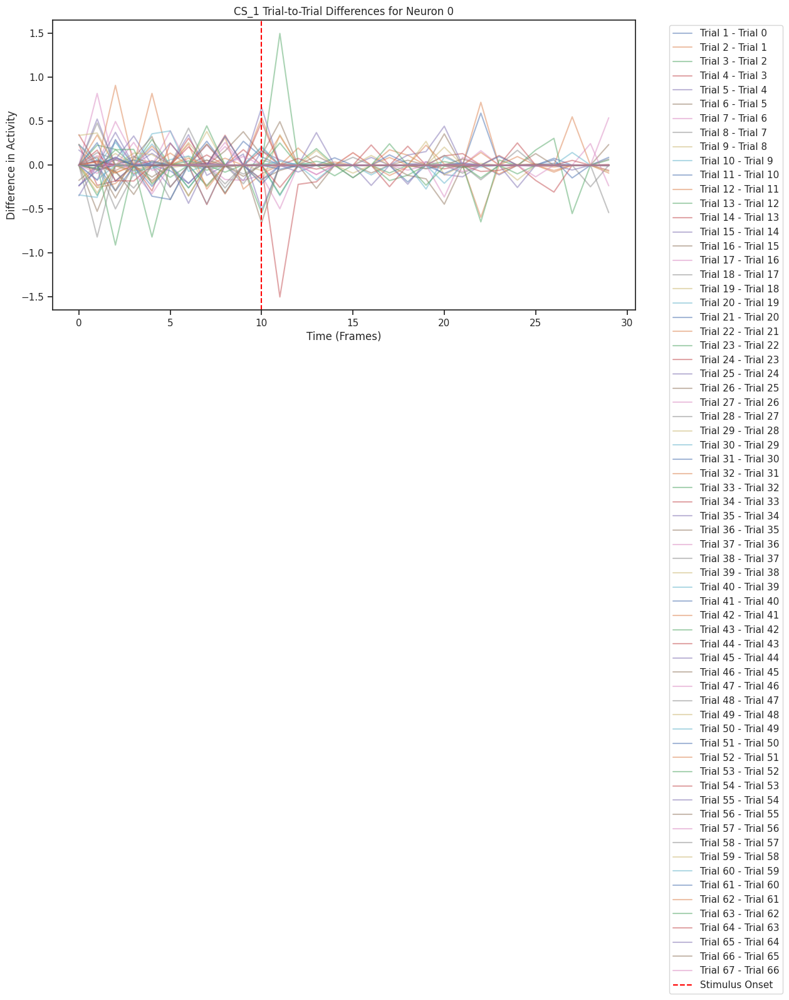

In [131]:
# Select a specific neuron to track
neuron_index = 0

plt.figure(figsize=(12, 6))
for trial in range(cs_1_response_vectors.shape[2] - 1):  # Number of trial differences
    plt.plot(cs_1_trial_differences[neuron_index, :, trial], label=f"Trial {trial+1} - Trial {trial}", alpha=0.5)

plt.title(f"CS_1 Trial-to-Trial Differences for Neuron {neuron_index}")
plt.xlabel("Time (Frames)")
plt.ylabel("Difference in Activity")
plt.axvline(x=frames_before, color="red", linestyle="--", label="Stimulus Onset")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


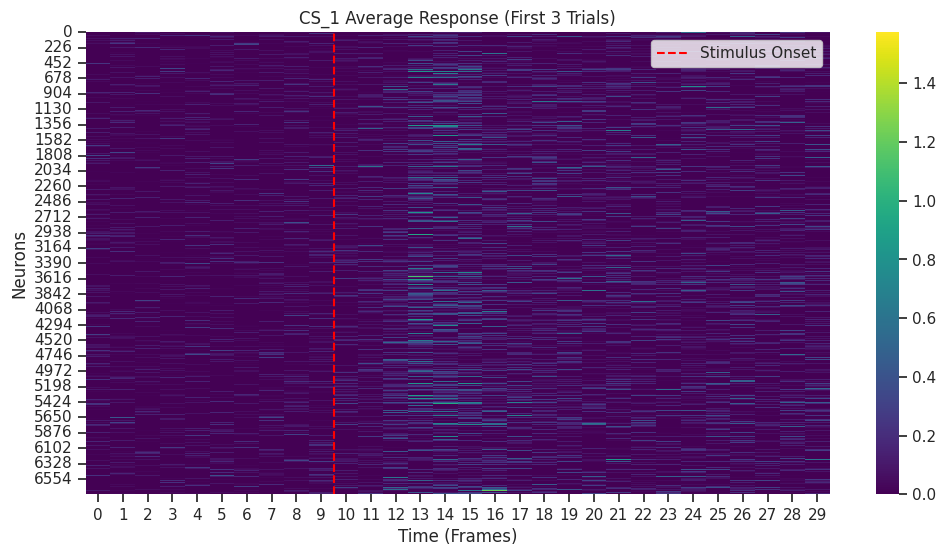

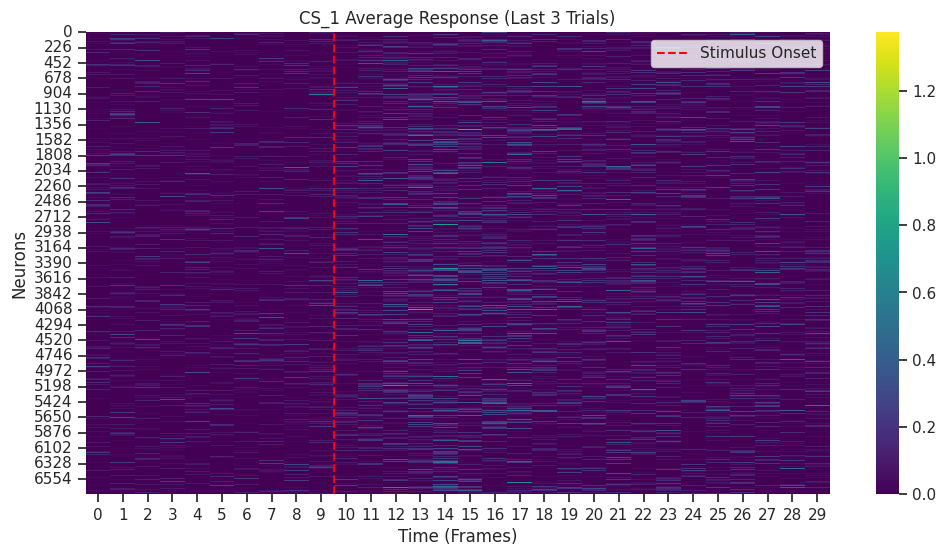

In [132]:
# First 3 trials for CS_1 and CS_2
cs_1_first_3 = cs_1_response_vectors[:, :, :3]  # Shape: (neurons, frames, 3)
cs_2_first_3 = cs_2_response_vectors[:, :, :3]

# Last 3 trials for CS_1 and CS_2
cs_1_last_3 = cs_1_response_vectors[:, :, -3:]  # Shape: (neurons, frames, 3)
cs_2_last_3 = cs_2_response_vectors[:, :, -3:]

# Mean response for first 3 trials
cs_1_first_3_mean = cs_1_first_3.mean(axis=2)  # Shape: (neurons, frames)
cs_2_first_3_mean = cs_2_first_3.mean(axis=2)

# Mean response for last 3 trials
cs_1_last_3_mean = cs_1_last_3.mean(axis=2)
cs_2_last_3_mean = cs_2_last_3.mean(axis=2)

# CS_1 Heatmaps
plt.figure(figsize=(12, 6))
sns.heatmap(cs_1_first_3_mean, cmap="viridis", cbar=True)
plt.title("CS_1 Average Response (First 3 Trials)")
plt.xlabel("Time (Frames)")
plt.ylabel("Neurons")
plt.axvline(x=frames_before, color="red", linestyle="--", label="Stimulus Onset")
plt.legend()
plt.show()

plt.figure(figsize=(12, 6))
sns.heatmap(cs_1_last_3_mean, cmap="viridis", cbar=True)
plt.title("CS_1 Average Response (Last 3 Trials)")
plt.xlabel("Time (Frames)")
plt.ylabel("Neurons")
plt.axvline(x=frames_before, color="red", linestyle="--", label="Stimulus Onset")
plt.legend()
plt.show()


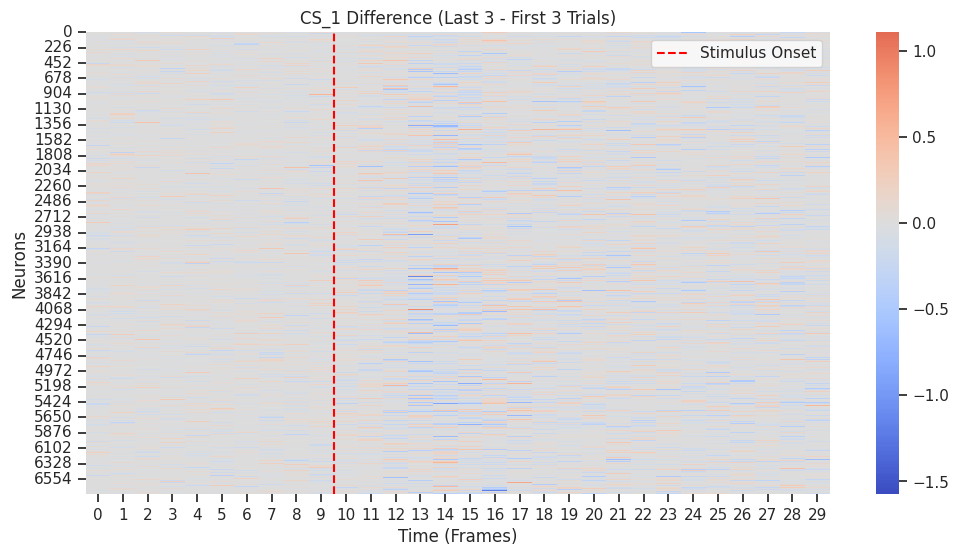

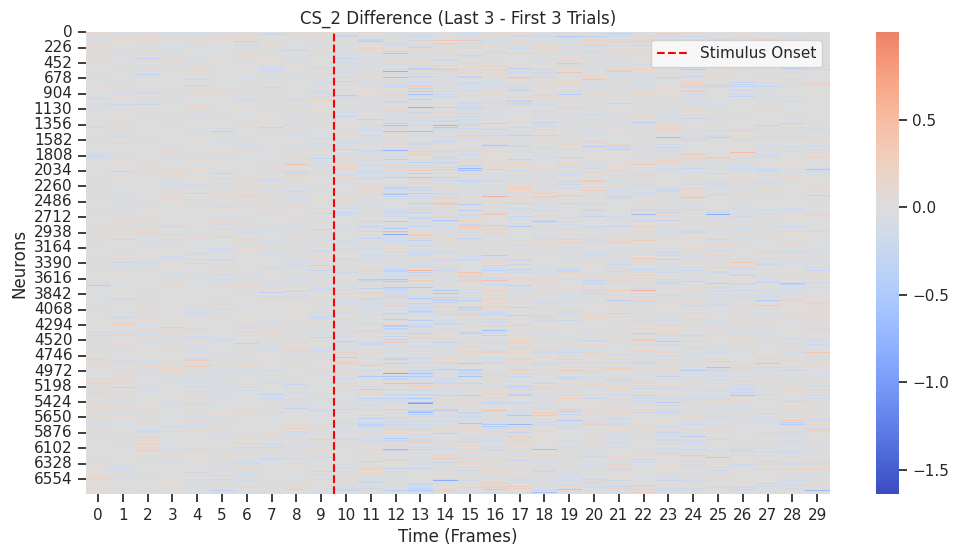

In [133]:
# Compute difference
cs_1_difference = cs_1_last_3_mean - cs_1_first_3_mean
cs_2_difference = cs_2_last_3_mean - cs_2_first_3_mean

# Heatmap of differences
plt.figure(figsize=(12, 6))
sns.heatmap(cs_1_difference, cmap="coolwarm", center=0, cbar=True)
plt.title("CS_1 Difference (Last 3 - First 3 Trials)")
plt.xlabel("Time (Frames)")
plt.ylabel("Neurons")
plt.axvline(x=frames_before, color="red", linestyle="--", label="Stimulus Onset")
plt.legend()
plt.show()

plt.figure(figsize=(12, 6))
sns.heatmap(cs_2_difference, cmap="coolwarm", center=0, cbar=True)
plt.title("CS_2 Difference (Last 3 - First 3 Trials)")
plt.xlabel("Time (Frames)")
plt.ylabel("Neurons")
plt.axvline(x=frames_before, color="red", linestyle="--", label="Stimulus Onset")
plt.legend()
plt.show()


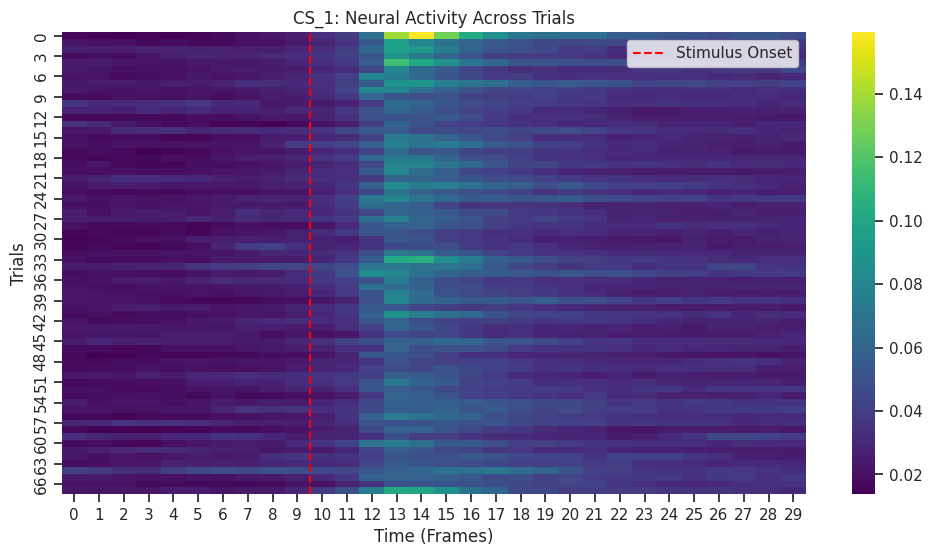

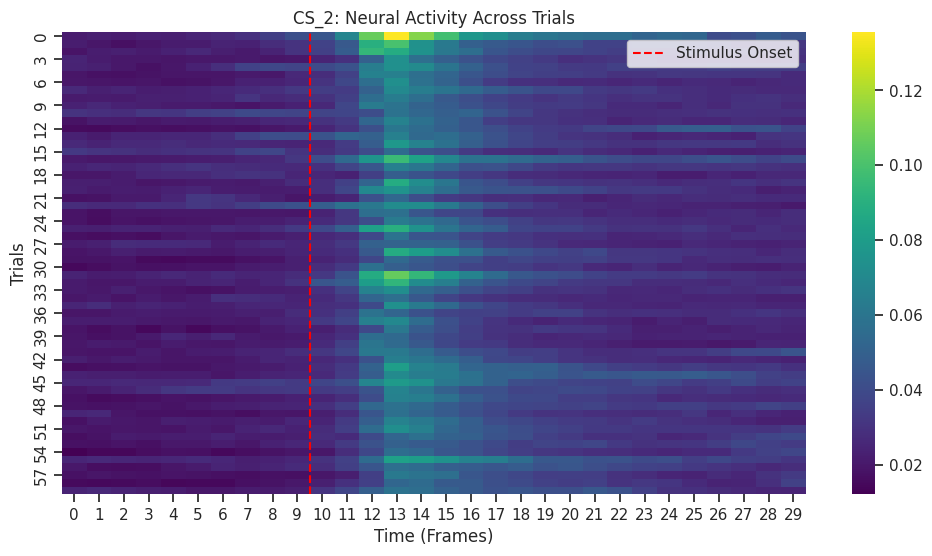

In [120]:
# Compute the mean neural activity across neurons for each trial
cs_1_trial_mean = cs_1_response_vectors.mean(axis=0)  # Shape: (frames, trials)
cs_2_trial_mean = cs_2_response_vectors.mean(axis=0)

# Plot heatmap for CS_1
plt.figure(figsize=(12, 6))
sns.heatmap(cs_1_trial_mean.T, cmap="viridis", cbar=True)
plt.title("CS_1: Neural Activity Across Trials")
plt.xlabel("Time (Frames)")
plt.ylabel("Trials")
plt.axvline(x=frames_before, color="red", linestyle="--", label="Stimulus Onset")
plt.legend()
plt.show()

# Plot heatmap for CS_2
plt.figure(figsize=(12, 6))
sns.heatmap(cs_2_trial_mean.T, cmap="viridis", cbar=True)
plt.title("CS_2: Neural Activity Across Trials")
plt.xlabel("Time (Frames)")
plt.ylabel("Trials")
plt.axvline(x=frames_before, color="red", linestyle="--", label="Stimulus Onset")
plt.legend()
plt.show()


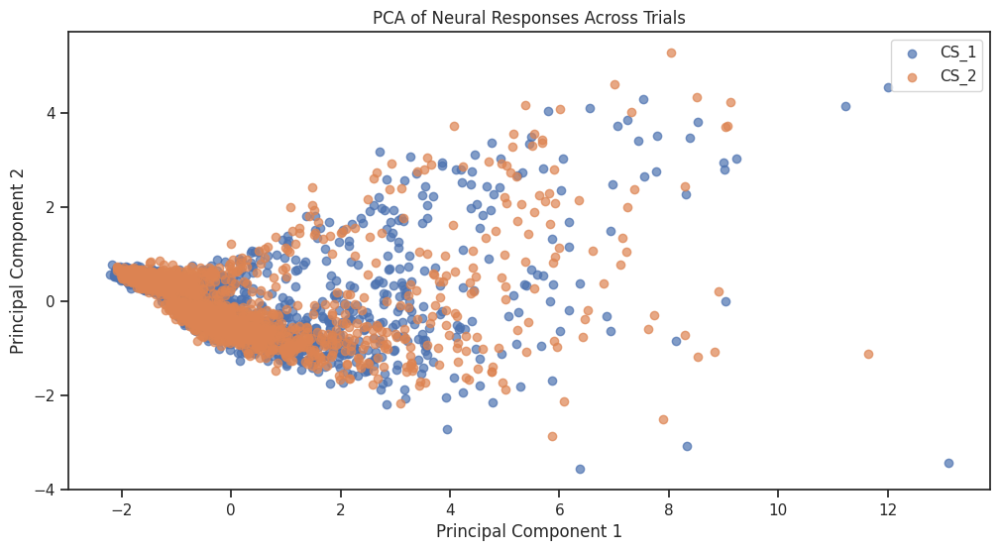

[0.04144289 0.00733432]
[0.04144289 0.04877721]


In [ ]:
# Reshape response vectors (neurons x frames x trials -> neurons x (frames * trials))
cs_1_reshaped = cs_1_response_vectors.reshape(cs_1_response_vectors.shape[0], -1)
cs_2_reshaped = cs_2_response_vectors.reshape(cs_2_response_vectors.shape[0], -1)

# Perform PCA
pca = PCA(n_components=2)
cs_1_pca = pca.fit_transform(cs_1_reshaped.T)  # Shape: (trials * frames, 2)
cs_2_pca = pca.fit_transform(cs_2_reshaped.T)

# Plot PCA results
plt.figure(figsize=(12, 6))
plt.scatter(cs_1_pca[:, 0], cs_1_pca[:, 1], alpha=0.7, label="CS_1")
plt.scatter(cs_2_pca[:, 0], cs_2_pca[:, 1], alpha=0.7, label="CS_2")
plt.title("PCA of Neural Responses Across Trials")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()
plt.show()

print(pca.explained_variance_ratio_)




# classify vectors according to stimulus onset

In [1]:
# Define frames around stimulus onset for training
frames_before = 10
frames_after = 20

# Extract stimulus-aligned fluorescence data
stimulus_fluorescence = []
cue_labels = []

for i, onset in enumerate(behavior['onsets']):
    start_frame = int(onset - frames_before)
    end_frame = int(onset + frames_after)
    if 0 <= start_frame and end_frame < norm_moving_deconvolved_filtered.shape[1]:
        stimulus_fluorescence.append(norm_moving_deconvolved_filtered[:, start_frame:end_frame].flatten())
        cue_labels.append(behavior['cue_codes'][i])  # Label as cs_1 or cs_2

stimulus_fluorescence = np.array(stimulus_fluorescence)  # Shape: (trials, neurons * frames)
cue_labels = np.array(cue_labels)  # Shape: (trials,)

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

# Split into training and testing data
x_train, x_test, y_train, y_test = train_test_split(stimulus_fluorescence, cue_labels, test_size=0.2, random_state=42)

# Train logistic regression
logistic_model = LogisticRegression(
    solver="lbfgs",
    penalty="l2",
    C=0.1,
    class_weight="balanced",
    multi_class="multinomial",
)
logistic_model.fit(x_train, y_train)

# Test on held-out data
y_pred = logistic_model.predict(x_test)
y_pred_proba = logistic_model.predict_proba(x_test)

print(f"Accuracy: {logistic_model.score(x_test, y_test):.2f}")


NameError: name 'behavior' is not defined

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

# Split into training and testing data
x_train, x_test, y_train, y_test = train_test_split(stimulus_fluorescence, cue_labels, test_size=0.2, random_state=42)

# Train logistic regression
logistic_model = LogisticRegression(
    solver="lbfgs",
    penalty="l2",
    C=0.1,
    class_weight="balanced",
    multi_class="multinomial",
)
logistic_model.fit(x_train, y_train)

# Test on held-out data
y_pred = logistic_model.predict(x_test)
y_pred_proba = logistic_model.predict_proba(x_test)

print(f"Accuracy: {logistic_model.score(x_test, y_test):.2f}")
print(f"Class Predictions: {y_pred}")
print(f"Prediction Probabilities: {y_pred_proba}")
